[![Roboflow Notebooks](https://media.roboflow.com/notebooks/template/bannertest2-2.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672932710194)](https://github.com/roboflow/notebooks)

# How to Train YOLO-NAS on Custom Dataset

This notebook is based on official [YOLO-NAS Notebook](https://colab.research.google.com/drive/1q0RmeVRzLwRXW-h9dPFSOchwJkThUy6d?usp=sharing) by DECI AI.

![YOLO-NAS on RF100](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_rf100.png)

## ⚠️ Disclaimer

YOLO-NAS is still very fresh. If you notice that our notebook behaves incorrectly - especially if you experience errors that prevent you from going through the tutorial - don't hesitate! Let us know and open an [issue](https://github.com/roboflow/notebooks/issues) on the Roboflow Notebooks repository.

## Pro Tip: Use GPU Acceleration

If you are running this notebook in Google Colab, navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`. This will ensure your notebook uses a GPU, which will significantly speed up model training times.

## Steps in this Tutorial

In this tutorial, we are going to cover:

- Before you start
- Install YOLO-NAS
- Inference with pre-trained COCO model
- Finding open source datasets
- ⭐️ Training YOLO-NAS on your custom dataset ⭐️
- Load trained model
- Evaluate trained model
- Inference with trained model

## 🔥 Let's begin!

## ⚡ Before you start

Let's make sure that we have access to GPU. We can use `nvidia-smi` command to do that. In case of any problems navigate to `Edit` -> `Notebook settings` -> `Hardware accelerator`, set it to `GPU`, and then click `Save`.

In [ ]:
import locale
# Set the locale to UTF-8
locale.setlocale(locale.LC_ALL, 'en_US.UTF-8')

gpu_info = !nvidia-smi
gpu_info = '\n'.join(gpu_info)
if gpu_info.find('failed') >= 0:
  print('Not connected to a GPU')
else:
  print(gpu_info)

: 

## Install YOLO-NAS


In [5]:
!pip install -q git+https://github.com/Deci-AI/super-gradients.git@stable
!pip install -q roboflow
!pip install -q supervision

ERROR: Cannot install super-gradients and super-gradients==3.7.1+master because these package versions have conflicting dependencies.
ERROR: ResolutionImpossible: for help visit https://pip.pypa.io/en/latest/topics/dependency-resolution/#dealing-with-dependency-conflicts


### 🚨 Restart the runtime

**After installation is complete, you'll need to restart the runtime after installation completes. Navigate to `Runtime` -> `Restart runtime` and confirm by clicking `Yes` when you see the popup.**

After that, carry on with the notebook starting from the cell below 👇

**NOTE:** To make it easier for us to manage datasets, images and models we create a `HOME` constant.

In [2]:
import os
HOME = os.getcwd()
print(HOME)

c:\Users\Nikolas Sanderson\Documents\GitHub\Python-Visual\noaa-ocean-challenge


## Inference with pre-trained COCO model

Start by instantiating a pretrained model. YOLO-NAS architecture comes in three different sizes: `yolo_nas_s`, `yolo_nas_m`, `and yolo_nas_l`. We will use `yolo_nas_l` throughout this notebook. Keep in mind that depending on your use-case your decision may be different. Take a peek at the diagram below visualizing the speed-accuracy tradeoff.

<br>

![YOLO-NAS](https://raw.githubusercontent.com/Deci-AI/super-gradients/master/documentation/source/images/yolo_nas_frontier.png)


In [3]:
import torch

DEVICE = 'cuda' if torch.cuda.is_available() else "cpu"
MODEL_ARCH = 'yolo_nas_l'

In [6]:


model = models.get(MODEL_ARCH, pretrained_weights="coco").to(DEVICE)

ModuleNotFoundError: No module named 'super_gradients'

### Use Example Data (Below, We'll Prepare Our Own Custom Dataset)

Let's download few example images. Feel free to replace my images with yours. All you have to do is upload them to the `{HOME}/data` directory. If you're looking for data, take a peek at [Roboflow Universe](https://universe.roboflow.com/)! You're sure to find something interesting.

In [6]:
f"{HOME}/data"

'/content/data'

In [7]:
%cd {HOME}
!mkdir {HOME}/data
%cd {HOME}/data

!wget -q https://media.roboflow.com/notebooks/examples/dog.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-2.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-3.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-4.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-5.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-6.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-7.jpeg
!wget -q https://media.roboflow.com/notebooks/examples/dog-8.jpeg

/content
/content/data


### Single Image Inference

In [8]:
SOURCE_IMAGE_PATH = f"{HOME}/data/dog-3.jpeg"

In [9]:
import cv2

image = cv2.imread(SOURCE_IMAGE_PATH)
result = model.predict (image, conf=0.35)

# Remove the list() call
# Access predictions within the result object
# For example, to get bounding boxes:
bboxes = result.prediction.bboxes_xyxy

[2024-08-22 17:47:25] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


### Output format

For every image YOLO-NAS will produce `ImageDetectionPrediction` object containing the following fields:
- `image` - `numpy.ndarray` - image used for inference
- `class_names` - `List[str]` - list of categories used for training the model
- `prediction` - `DetectionPrediction` - class instance containing detailed informationabout the obtained detections
   - `bboxes_xyxy` - `numpy.ndarray` of `float32` and `(N, 4)` shape - detection bounding boxes in `xyxy` format
   - `confidence` - `numpy.ndarray` of `float32` and `(N,)` shape - confidence value between `0` and `1`
   - `labels` - `numpy.ndarray` of `float32` and `(N,)` shape - `class_id` related to the index in the `class_names` list

In [10]:
type(result)

super_gradients.training.utils.predict.prediction_results.ImageDetectionPrediction

### Visualize Inference Result

As with other models, you can use Supervision to visualize your results. You can read more about the integration between Supervision and YOLO-NAS [here](https://roboflow.github.io/supervision/detection/core/#supervision.detection.core.Detections.from_yolo_nas), and about visualizing detection [here](https://roboflow.github.io/supervision/detection/annotate/#supervision.detection.annotate.BoxAnnotator.annotate).

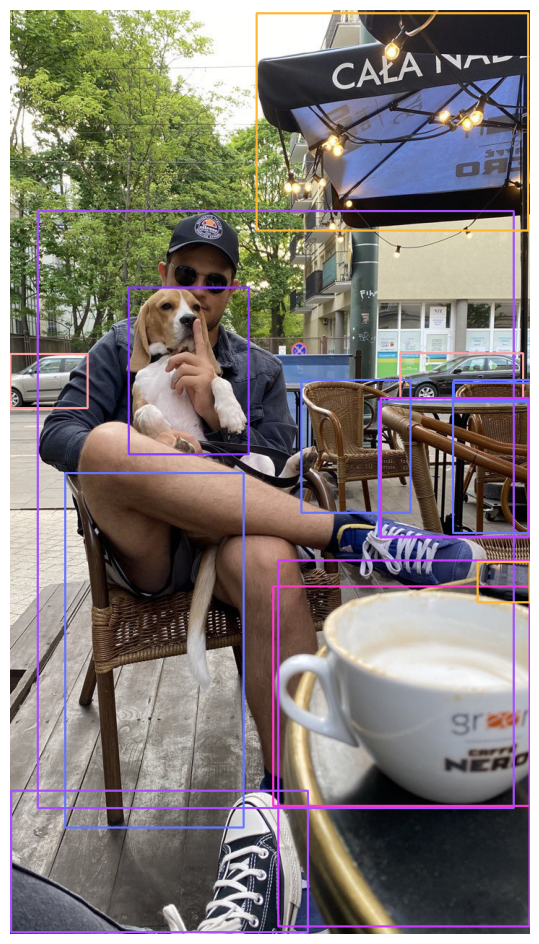

In [11]:
import supervision as sv

detections = sv.Detections(
    xyxy=result.prediction.bboxes_xyxy,
    confidence=result.prediction.confidence,
    class_id=result.prediction.labels.astype(int)
)

box_annotator = sv.BoxAnnotator()

labels = [
    f"{result.class_names[class_id]} {confidence:0.2f}"
    for _, _, confidence, class_id, _, _,
    in detections
]

annotated_frame = box_annotator.annotate(
    scene=image.copy(),
    detections=detections,
    #labels=labels
)

%matplotlib inline
sv.plot_image(annotated_frame, (12, 12))

## Over 100k Open Source Computer Vision Datasets are on Roboflow Universe

Need data for your project? Before spending time on annotating, check out Roboflow Universe, a repository of more than 110,000 open-source datasets that you can use in your projects. You'll find datasets containing everything from annotated cracks in concrete to plant images with disease annotations.


[![Roboflow Universe](https://media.roboflow.com/notebooks/template/uni-banner-frame.png?ik-sdk-version=javascript-1.4.3&updatedAt=1672878480290)](https://universe.roboflow.com/)



# Training YOLO-NAS on a Custom Dataset

## Preparing a custom dataset

Building a custom dataset can be a painful process. It might take dozens or even hundreds of hours to collect images, label them, and export them in the proper format. Fortunately, Roboflow makes this process as straightforward and fast as possible. Let me show you how!

### Step 1: Creating project

Before you start, you need to create a Roboflow [account](https://app.roboflow.com/login). Once you do that, you can create a new project in the Roboflow [dashboard](https://app.roboflow.com/). Keep in mind to choose the right project type. In our case, Object Detection.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/creating-project.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672929799852"
  >
</div>

### Step 2: Uploading images or video

Next, add the data to your newly created project. You can do it via API or through our [web interface](https://docs.roboflow.com/adding-data/object-detection).

If you drag and drop a directory with a dataset in a supported format, the Roboflow dashboard will automatically read the images and annotations together.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/uploading-images.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672929808290"
  >
</div>

### Step 3: Labeling

If you only have images, you can label them in [Roboflow Annotate](https://docs.roboflow.com/annotate).

<div align="center">
  <img
    width="640"
    src="https://user-images.githubusercontent.com/26109316/210901980-04861efd-dfc0-4a01-9373-13a36b5e1df4.gif"
  >
</div>

### Step 4: Generate new dataset version

Now that we have our images and annotations added, we can Generate a Dataset Version. When Generating a Version, you may elect to add preprocessing and augmentations. This step is completely optional, however, it can allow you to significantly improve the robustness of your model.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/generate-new-version.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1673003597834"
  >
</div>

### Step 5: Exporting dataset

Once the dataset version is generated, we have a hosted dataset we can load directly into our notebook for easy training. Click `Export` and select the `YOLO v5 PyTorch` dataset format.

<div align="center">
  <img
    width="640"
    src="https://media.roboflow.com/preparing-custom-dataset-example/export.gif?ik-sdk-version=javascript-1.4.3&updatedAt=1672943313709"
  >
</div>




In [12]:
%cd {HOME}

import roboflow
from roboflow import Roboflow

roboflow.login()

rf = Roboflow(api_key="FJrZK2nFqdBYKfkx6xb0")
project = rf.workspace("aquaphoton-ufis0").project("noaa-nhxc9")
version = project.version(3)
dataset = version.download("yolov5")

/content
visit https://app.roboflow.com/auth-cli to get your authentication token.
Paste the authentication token here: ··········
loading Roboflow workspace...
loading Roboflow project...


Extracting Dataset Version Zip to NOAA-3 in yolov5pytorch::   0%|          | 0/1232 [00:00<?, ?it/s]

In [13]:
LOCATION = dataset.location
print("location:", LOCATION)
CLASSES = sorted(project.classes.keys())
print("classes:", CLASSES)

location: /content/NOAA-3
classes: ['brittle-stars']


## Fine-tune on custom dataset

`ckpt_root_dir` - this is the directory where results from all your experiments will be saved

`experiment_name` - all checkpoints, logs, and tensorboards will be saved in a directory with the name you specify here.

In [56]:
MODEL_ARCH = 'yolo_nas_l'
BATCH_SIZE = 8
MAX_EPOCHS = 75
CHECKPOINT_DIR = f'{HOME}/checkpoints'
EXPERIMENT_NAME = project.name.lower().replace(" ", "_")

In [57]:
from super_gradients.training import Trainer

trainer = Trainer(experiment_name=EXPERIMENT_NAME, ckpt_root_dir=CHECKPOINT_DIR)

In [58]:
dataset_params = {
    'data_dir': LOCATION,
    'train_images_dir':'train/images',
    'train_labels_dir':'train/labels',
    'val_images_dir':'valid/images',
    'val_labels_dir':'valid/labels',
    'test_images_dir':'test/images',
    'test_labels_dir':'test/labels',
    'classes': CLASSES
}

In [59]:
from super_gradients.training.dataloaders.dataloaders import (
    coco_detection_yolo_format_train, coco_detection_yolo_format_val)

train_data = coco_detection_yolo_format_train(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['train_images_dir'],
        'labels_dir': dataset_params['train_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

val_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['val_images_dir'],
        'labels_dir': dataset_params['val_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

test_data = coco_detection_yolo_format_val(
    dataset_params={
        'data_dir': dataset_params['data_dir'],
        'images_dir': dataset_params['test_images_dir'],
        'labels_dir': dataset_params['test_labels_dir'],
        'classes': dataset_params['classes']
    },
    dataloader_params={
        'batch_size': BATCH_SIZE,
        'num_workers': 2
    }
)

[2024-08-22 18:20:55] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 453/453 [00:00<00:00, 2170.49it/s]
[2024-08-22 18:20:55] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 110/110 [00:00<00:00, 2032.43it/s]
[2024-08-22 18:20:55] INFO - detection_dataset.py - Dataset Initialization in progress. `cache_annotations=True` causes the process to take longer due to full dataset indexing.
Indexing dataset annotations: 100%|██████████| 47/47 [00:00<00:00, 1995.02it/s]


**NOTE:** Let's inspect our dataset

In [60]:
train_data.dataset.transforms

### Instantiate the model

In [61]:
from super_gradients.training import models

model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    pretrained_weights="coco"
)

[2024-08-22 18:21:01] WARNING - checkpoint_utils.py - :warning: The pre-trained models provided by SuperGradients may have their own licenses or terms and conditions derived from the dataset used for pre-training.
 It is your responsibility to determine whether you have permission to use the models for your use case.
 The model you have requested was pre-trained on the coco dataset, published under the following terms: https://cocodataset.org/#termsofuse
[2024-08-22 18:21:01] INFO - checkpoint_utils.py - License Notification: YOLO-NAS pre-trained weights are subjected to the specific license terms and conditions detailed in 
https://github.com/Deci-AI/super-gradients/blob/master/LICENSE.YOLONAS.md
By downloading the pre-trained weight files you agree to comply with these terms.
[2024-08-22 18:21:01] INFO - checkpoint_utils.py - Successfully loaded pretrained weights for architecture yolo_nas_l


### Define metrics and training parameters

In [62]:
from super_gradients.training.losses import PPYoloELoss
from super_gradients.training.metrics import DetectionMetrics_050
from super_gradients.training.models.detection_models.pp_yolo_e import PPYoloEPostPredictionCallback

train_params = {
    'silent_mode': False,
    "average_best_models":True,
    "warmup_mode": "linear_epoch_step",
    "warmup_initial_lr": 1e-6,
    "lr_warmup_epochs": 3,
    "initial_lr": 5e-4,
    "lr_mode": "cosine",
    "cosine_final_lr_ratio": 0.1,
    "optimizer": "Adam",
    "optimizer_params": {"weight_decay": 0.0001},
    "zero_weight_decay_on_bias_and_bn": True,
    "ema": True,
    "ema_params": {"decay": 0.9, "decay_type": "threshold"},
    "max_epochs": MAX_EPOCHS,
    "mixed_precision": True,
    "loss": PPYoloELoss(
        use_static_assigner=False,
        num_classes=len(dataset_params['classes']),
        reg_max=16
    ),
    "valid_metrics_list": [
        DetectionMetrics_050(
            score_thres=0.1,
            top_k_predictions=300,
            num_cls=len(dataset_params['classes']),
            normalize_targets=True,
            post_prediction_callback=PPYoloEPostPredictionCallback(
                score_threshold=0.01,
                nms_top_k=1000,
                max_predictions=300,
                nms_threshold=0.7
            )
        )
    ],
    "metric_to_watch": 'mAP@0.50'
}

### Train the model

In [63]:
trainer.train(
    model=model,
    training_params=train_params,
    train_loader=train_data,
    valid_loader=val_data
)

[2024-08-22 18:21:05] INFO - sg_trainer.py - Starting a new run with `run_id=RUN_20240822_182105_478475`
[2024-08-22 18:21:05] INFO - sg_trainer.py - Checkpoints directory: /content/checkpoints/noaa/RUN_20240822_182105_478475
[2024-08-22 18:21:05] INFO - sg_trainer.py - Using EMA with params {'decay': 0.9, 'decay_type': 'threshold'}
Object name `linear_epoch_step` is now deprecated. Please replace it with `LinearEpochLRWarmup`.
initialize_param_groups and update_param_groups usages are deprecated since 3.4.0, will be removed in 3.5.0 and have no effect. 
 Assign different learning rates by passing a mapping of layer name prefixes to lr values through initial_lr training hyperparameter (i.e initial_lr={'backbone': 0.01, 'default':0.1})
os.fork() was called. os.fork() is incompatible with multithreaded code, and JAX is multithreaded, so this will likely lead to a deadlock.


The console stream is now moved to /content/checkpoints/noaa/RUN_20240822_182105_478475/console_Aug22_18_21_05.txt


[2024-08-22 18:21:07] INFO - sg_trainer_utils.py - TRAINING PARAMETERS:
    - Mode:                         Single GPU
    - Number of GPUs:               1          (1 available on the machine)
    - Full dataset size:            453        (len(train_set))
    - Batch size per GPU:           8          (batch_size)
    - Batch Accumulate:             1          (batch_accumulate)
    - Total batch size:             8          (num_gpus * batch_size)
    - Effective Batch size:         8          (num_gpus * batch_size * batch_accumulate)
    - Iterations per epoch:         56         (len(train_loader))
    - Gradient updates per epoch:   56         (len(train_loader) / batch_accumulate)
    - Model: YoloNAS_L  (66.91M parameters, 66.91M optimized)
    - Learning Rates and Weight Decays:
      - default: (66.91M parameters). LR: 0.0005 (66.91M parameters) WD: 0.0, (84.69K parameters), WD: 0.0001, (66.82M parameters)

[2024-08-22 18:21:07] INFO - sg_trainer.py - Started training for 7

SUMMARY OF EPOCH 0
├── Train
│   ├── Ppyoloeloss/loss_cls = 1.5937
│   ├── Ppyoloeloss/loss_iou = 1.504
│   ├── Ppyoloeloss/loss_dfl = 0.8703
│   └── Ppyoloeloss/loss = 3.9681
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.6598
    ├── Ppyoloeloss/loss_iou = 1.4482
    ├── Ppyoloeloss/loss_dfl = 0.7493
    ├── Ppyoloeloss/loss = 3.8574
    ├── Precision@0.50 = 0.0
    ├── Recall@0.50 = 0.0
    ├── Map@0.50 = 0.0003
    ├── F1@0.50 = 0.0
    └── Best_score_threshold = 0.0



Validating epoch 1: 100%|██████████| 14/14 [00:07<00:00,  1.88it/s]
[2024-08-22 18:22:27] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:22:27] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.5505799651145935


SUMMARY OF EPOCH 1
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.9706
│   │   ├── Epoch N-1      = 1.5937 (↘ -0.6231)
│   │   └── Best until now = 1.5937 (↘ -0.6231)
│   ├── Ppyoloeloss/loss_iou = 0.9939
│   │   ├── Epoch N-1      = 1.504  (↘ -0.5102)
│   │   └── Best until now = 1.504  (↘ -0.5102)
│   ├── Ppyoloeloss/loss_dfl = 0.4725
│   │   ├── Epoch N-1      = 0.8703 (↘ -0.3979)
│   │   └── Best until now = 0.8703 (↘ -0.3979)
│   └── Ppyoloeloss/loss = 2.437
│       ├── Epoch N-1      = 3.9681 (↘ -1.5311)
│       └── Best until now = 3.9681 (↘ -1.5311)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.4929
    │   ├── Epoch N-1      = 1.6598 (↘ -0.167)
    │   └── Best until now = 1.6598 (↘ -0.167)
    ├── Ppyoloeloss/loss_iou = 0.8353
    │   ├── Epoch N-1      = 1.4482 (↘ -0.613)
    │   └── Best until now = 1.4482 (↘ -0.613)
    ├── Ppyoloeloss/loss_dfl = 0.4088
    │   ├── Epoch N-1      = 0.7493 (↘ -0.3405)
    │   └── Best until now = 0.7493 (↘ -0.3405)
    ├── Ppyoloeloss/loss = 

Validating epoch 2: 100%|██████████| 14/14 [00:07<00:00,  1.87it/s]
[2024-08-22 18:23:08] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:23:08] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6685199737548828


SUMMARY OF EPOCH 2
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8171
│   │   ├── Epoch N-1      = 0.9706 (↘ -0.1535)
│   │   └── Best until now = 0.9706 (↘ -0.1535)
│   ├── Ppyoloeloss/loss_iou = 0.8365
│   │   ├── Epoch N-1      = 0.9939 (↘ -0.1573)
│   │   └── Best until now = 0.9939 (↘ -0.1573)
│   ├── Ppyoloeloss/loss_dfl = 0.414
│   │   ├── Epoch N-1      = 0.4725 (↘ -0.0585)
│   │   └── Best until now = 0.4725 (↘ -0.0585)
│   └── Ppyoloeloss/loss = 2.0676
│       ├── Epoch N-1      = 2.437  (↘ -0.3694)
│       └── Best until now = 2.437  (↘ -0.3694)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.1758
    │   ├── Epoch N-1      = 1.4929 (↘ -0.3171)
    │   └── Best until now = 1.4929 (↘ -0.3171)
    ├── Ppyoloeloss/loss_iou = 0.7795
    │   ├── Epoch N-1      = 0.8353 (↘ -0.0558)
    │   └── Best until now = 0.8353 (↘ -0.0558)
    ├── Ppyoloeloss/loss_dfl = 0.4032
    │   ├── Epoch N-1      = 0.4088 (↘ -0.0056)
    │   └── Best until now = 0.4088 (↘ -0.0056)
    ├── Ppyoloeloss/los

Validating epoch 3: 100%|██████████| 14/14 [00:06<00:00,  2.06it/s]


SUMMARY OF EPOCH 3
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.823
│   │   ├── Epoch N-1      = 0.8171 (↗ 0.0059)
│   │   └── Best until now = 0.8171 (↗ 0.0059)
│   ├── Ppyoloeloss/loss_iou = 0.7939
│   │   ├── Epoch N-1      = 0.8365 (↘ -0.0426)
│   │   └── Best until now = 0.8365 (↘ -0.0426)
│   ├── Ppyoloeloss/loss_dfl = 0.4071
│   │   ├── Epoch N-1      = 0.414  (↘ -0.0068)
│   │   └── Best until now = 0.414  (↘ -0.0068)
│   └── Ppyoloeloss/loss = 2.0241
│       ├── Epoch N-1      = 2.0676 (↘ -0.0435)
│       └── Best until now = 2.0676 (↘ -0.0435)
└── Validation
    ├── Ppyoloeloss/loss_cls = 1.0325
    │   ├── Epoch N-1      = 1.1758 (↘ -0.1433)
    │   └── Best until now = 1.1758 (↘ -0.1433)
    ├── Ppyoloeloss/loss_iou = 0.8396
    │   ├── Epoch N-1      = 0.7795 (↗ 0.0602)
    │   └── Best until now = 0.7795 (↗ 0.0602)
    ├── Ppyoloeloss/loss_dfl = 0.4357
    │   ├── Epoch N-1      = 0.4032 (↗ 0.0325)
    │   └── Best until now = 0.4032 (↗ 0.0325)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 4: 100%|██████████| 14/14 [00:07<00:00,  1.90it/s]
[2024-08-22 18:24:31] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:24:31] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.6687498092651367


SUMMARY OF EPOCH 4
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8316
│   │   ├── Epoch N-1      = 0.823  (↗ 0.0086)
│   │   └── Best until now = 0.8171 (↗ 0.0145)
│   ├── Ppyoloeloss/loss_iou = 0.7595
│   │   ├── Epoch N-1      = 0.7939 (↘ -0.0344)
│   │   └── Best until now = 0.7939 (↘ -0.0344)
│   ├── Ppyoloeloss/loss_dfl = 0.3993
│   │   ├── Epoch N-1      = 0.4071 (↘ -0.0079)
│   │   └── Best until now = 0.4071 (↘ -0.0079)
│   └── Ppyoloeloss/loss = 1.9904
│       ├── Epoch N-1      = 2.0241 (↘ -0.0337)
│       └── Best until now = 2.0241 (↘ -0.0337)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9478
    │   ├── Epoch N-1      = 1.0325 (↘ -0.0847)
    │   └── Best until now = 1.0325 (↘ -0.0847)
    ├── Ppyoloeloss/loss_iou = 0.7727
    │   ├── Epoch N-1      = 0.8396 (↘ -0.0669)
    │   └── Best until now = 0.7795 (↘ -0.0068)
    ├── Ppyoloeloss/loss_dfl = 0.4052
    │   ├── Epoch N-1      = 0.4357 (↘ -0.0305)
    │   └── Best until now = 0.4032 (↗ 0.002)
    ├── Ppyoloeloss/loss =

Validating epoch 5: 100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


SUMMARY OF EPOCH 5
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8266
│   │   ├── Epoch N-1      = 0.8316 (↘ -0.005)
│   │   └── Best until now = 0.8171 (↗ 0.0095)
│   ├── Ppyoloeloss/loss_iou = 0.7407
│   │   ├── Epoch N-1      = 0.7595 (↘ -0.0189)
│   │   └── Best until now = 0.7595 (↘ -0.0189)
│   ├── Ppyoloeloss/loss_dfl = 0.392
│   │   ├── Epoch N-1      = 0.3993 (↘ -0.0072)
│   │   └── Best until now = 0.3993 (↘ -0.0072)
│   └── Ppyoloeloss/loss = 1.9593
│       ├── Epoch N-1      = 1.9904 (↘ -0.0311)
│       └── Best until now = 1.9904 (↘ -0.0311)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8986
    │   ├── Epoch N-1      = 0.9478 (↘ -0.0492)
    │   └── Best until now = 0.9478 (↘ -0.0492)
    ├── Ppyoloeloss/loss_iou = 0.7823
    │   ├── Epoch N-1      = 0.7727 (↗ 0.0096)
    │   └── Best until now = 0.7727 (↗ 0.0096)
    ├── Ppyoloeloss/loss_dfl = 0.4088
    │   ├── Epoch N-1      = 0.4052 (↗ 0.0036)
    │   └── Best until now = 0.4032 (↗ 0.0056)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 6: 100%|██████████| 14/14 [00:07<00:00,  2.00it/s]
[2024-08-22 18:25:59] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:25:59] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7090913653373718


SUMMARY OF EPOCH 6
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8311
│   │   ├── Epoch N-1      = 0.8266 (↗ 0.0045)
│   │   └── Best until now = 0.8171 (↗ 0.014)
│   ├── Ppyoloeloss/loss_iou = 0.7322
│   │   ├── Epoch N-1      = 0.7407 (↘ -0.0084)
│   │   └── Best until now = 0.7407 (↘ -0.0084)
│   ├── Ppyoloeloss/loss_dfl = 0.3881
│   │   ├── Epoch N-1      = 0.392  (↘ -0.0039)
│   │   └── Best until now = 0.392  (↘ -0.0039)
│   └── Ppyoloeloss/loss = 1.9514
│       ├── Epoch N-1      = 1.9593 (↘ -0.0079)
│       └── Best until now = 1.9593 (↘ -0.0079)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8928
    │   ├── Epoch N-1      = 0.8986 (↘ -0.0058)
    │   └── Best until now = 0.8986 (↘ -0.0058)
    ├── Ppyoloeloss/loss_iou = 0.7561
    │   ├── Epoch N-1      = 0.7823 (↘ -0.0262)
    │   └── Best until now = 0.7727 (↘ -0.0165)
    ├── Ppyoloeloss/loss_dfl = 0.3979
    │   ├── Epoch N-1      = 0.4088 (↘ -0.0109)
    │   └── Best until now = 0.4032 (↘ -0.0053)
    ├── Ppyoloeloss/loss 

Validating epoch 7: 100%|██████████| 14/14 [00:06<00:00,  2.05it/s]


SUMMARY OF EPOCH 7
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8233
│   │   ├── Epoch N-1      = 0.8311 (↘ -0.0078)
│   │   └── Best until now = 0.8171 (↗ 0.0062)
│   ├── Ppyoloeloss/loss_iou = 0.725
│   │   ├── Epoch N-1      = 0.7322 (↘ -0.0073)
│   │   └── Best until now = 0.7322 (↘ -0.0073)
│   ├── Ppyoloeloss/loss_dfl = 0.389
│   │   ├── Epoch N-1      = 0.3881 (↗ 0.0009)
│   │   └── Best until now = 0.3881 (↗ 0.0009)
│   └── Ppyoloeloss/loss = 1.9373
│       ├── Epoch N-1      = 1.9514 (↘ -0.0141)
│       └── Best until now = 1.9514 (↘ -0.0141)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8904
    │   ├── Epoch N-1      = 0.8928 (↘ -0.0024)
    │   └── Best until now = 0.8928 (↘ -0.0024)
    ├── Ppyoloeloss/loss_iou = 0.7944
    │   ├── Epoch N-1      = 0.7561 (↗ 0.0382)
    │   └── Best until now = 0.7561 (↗ 0.0382)
    ├── Ppyoloeloss/loss_dfl = 0.4076
    │   ├── Epoch N-1      = 0.3979 (↗ 0.0096)
    │   └── Best until now = 0.3979 (↗ 0.0096)
    ├── Ppyoloeloss/loss = 2.09

Validating epoch 8: 100%|██████████| 14/14 [00:06<00:00,  2.02it/s]
[2024-08-22 18:27:32] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:27:32] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7324562668800354


SUMMARY OF EPOCH 8
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8253
│   │   ├── Epoch N-1      = 0.8233 (↗ 0.002)
│   │   └── Best until now = 0.8171 (↗ 0.0082)
│   ├── Ppyoloeloss/loss_iou = 0.7115
│   │   ├── Epoch N-1      = 0.725  (↘ -0.0135)
│   │   └── Best until now = 0.725  (↘ -0.0135)
│   ├── Ppyoloeloss/loss_dfl = 0.3846
│   │   ├── Epoch N-1      = 0.389  (↘ -0.0044)
│   │   └── Best until now = 0.3881 (↘ -0.0035)
│   └── Ppyoloeloss/loss = 1.9214
│       ├── Epoch N-1      = 1.9373 (↘ -0.0159)
│       └── Best until now = 1.9373 (↘ -0.0159)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8513
    │   ├── Epoch N-1      = 0.8904 (↘ -0.0392)
    │   └── Best until now = 0.8904 (↘ -0.0392)
    ├── Ppyoloeloss/loss_iou = 0.7182
    │   ├── Epoch N-1      = 0.7944 (↘ -0.0762)
    │   └── Best until now = 0.7561 (↘ -0.0379)
    ├── Ppyoloeloss/loss_dfl = 0.3844
    │   ├── Epoch N-1      = 0.4076 (↘ -0.0232)
    │   └── Best until now = 0.3979 (↘ -0.0136)
    ├── Ppyoloeloss/loss 

Validating epoch 9: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]
[2024-08-22 18:28:19] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:28:19] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7423866391181946


SUMMARY OF EPOCH 9
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8224
│   │   ├── Epoch N-1      = 0.8253 (↘ -0.0029)
│   │   └── Best until now = 0.8171 (↗ 0.0053)
│   ├── Ppyoloeloss/loss_iou = 0.7087
│   │   ├── Epoch N-1      = 0.7115 (↘ -0.0028)
│   │   └── Best until now = 0.7115 (↘ -0.0028)
│   ├── Ppyoloeloss/loss_dfl = 0.3832
│   │   ├── Epoch N-1      = 0.3846 (↘ -0.0015)
│   │   └── Best until now = 0.3846 (↘ -0.0015)
│   └── Ppyoloeloss/loss = 1.9143
│       ├── Epoch N-1      = 1.9214 (↘ -0.0072)
│       └── Best until now = 1.9214 (↘ -0.0072)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.87
    │   ├── Epoch N-1      = 0.8513 (↗ 0.0188)
    │   └── Best until now = 0.8513 (↗ 0.0188)
    ├── Ppyoloeloss/loss_iou = 0.74
    │   ├── Epoch N-1      = 0.7182 (↗ 0.0218)
    │   └── Best until now = 0.7182 (↗ 0.0218)
    ├── Ppyoloeloss/loss_dfl = 0.3916
    │   ├── Epoch N-1      = 0.3844 (↗ 0.0072)
    │   └── Best until now = 0.3844 (↗ 0.0072)
    ├── Ppyoloeloss/loss = 2.0016

Validating epoch 10: 100%|██████████| 14/14 [00:06<00:00,  2.02it/s]


SUMMARY OF EPOCH 10
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8288
│   │   ├── Epoch N-1      = 0.8224 (↗ 0.0064)
│   │   └── Best until now = 0.8171 (↗ 0.0117)
│   ├── Ppyoloeloss/loss_iou = 0.7102
│   │   ├── Epoch N-1      = 0.7087 (↗ 0.0015)
│   │   └── Best until now = 0.7087 (↗ 0.0015)
│   ├── Ppyoloeloss/loss_dfl = 0.3862
│   │   ├── Epoch N-1      = 0.3832 (↗ 0.003)
│   │   └── Best until now = 0.3832 (↗ 0.003)
│   └── Ppyoloeloss/loss = 1.9252
│       ├── Epoch N-1      = 1.9143 (↗ 0.0109)
│       └── Best until now = 1.9143 (↗ 0.0109)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8837
    │   ├── Epoch N-1      = 0.87   (↗ 0.0137)
    │   └── Best until now = 0.8513 (↗ 0.0325)
    ├── Ppyoloeloss/loss_iou = 0.7381
    │   ├── Epoch N-1      = 0.74   (↘ -0.002)
    │   └── Best until now = 0.7182 (↗ 0.0198)
    ├── Ppyoloeloss/loss_dfl = 0.3901
    │   ├── Epoch N-1      = 0.3916 (↘ -0.0015)
    │   └── Best until now = 0.3844 (↗ 0.0057)
    ├── Ppyoloeloss/loss = 2.0119
  

Validating epoch 11: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]


SUMMARY OF EPOCH 11
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8258
│   │   ├── Epoch N-1      = 0.8288 (↘ -0.0031)
│   │   └── Best until now = 0.8171 (↗ 0.0087)
│   ├── Ppyoloeloss/loss_iou = 0.7088
│   │   ├── Epoch N-1      = 0.7102 (↘ -0.0014)
│   │   └── Best until now = 0.7087 (↗ 1e-04)
│   ├── Ppyoloeloss/loss_dfl = 0.3832
│   │   ├── Epoch N-1      = 0.3862 (↘ -0.003)
│   │   └── Best until now = 0.3832 (↗ 0.0)
│   └── Ppyoloeloss/loss = 1.9178
│       ├── Epoch N-1      = 1.9252 (↘ -0.0074)
│       └── Best until now = 1.9143 (↗ 0.0035)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8423
    │   ├── Epoch N-1      = 0.8837 (↘ -0.0414)
    │   └── Best until now = 0.8513 (↘ -0.0089)
    ├── Ppyoloeloss/loss_iou = 0.7425
    │   ├── Epoch N-1      = 0.7381 (↗ 0.0044)
    │   └── Best until now = 0.7182 (↗ 0.0243)
    ├── Ppyoloeloss/loss_dfl = 0.39
    │   ├── Epoch N-1      = 0.3901 (↘ -1e-04)
    │   └── Best until now = 0.3844 (↗ 0.0056)
    ├── Ppyoloeloss/loss = 1.9748
  

Validating epoch 12: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 12
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.828
│   │   ├── Epoch N-1      = 0.8258 (↗ 0.0023)
│   │   └── Best until now = 0.8171 (↗ 0.0109)
│   ├── Ppyoloeloss/loss_iou = 0.6955
│   │   ├── Epoch N-1      = 0.7088 (↘ -0.0133)
│   │   └── Best until now = 0.7087 (↘ -0.0132)
│   ├── Ppyoloeloss/loss_dfl = 0.3822
│   │   ├── Epoch N-1      = 0.3832 (↘ -0.001)
│   │   └── Best until now = 0.3832 (↘ -0.0009)
│   └── Ppyoloeloss/loss = 1.9057
│       ├── Epoch N-1      = 1.9178 (↘ -0.012)
│       └── Best until now = 1.9143 (↘ -0.0085)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8825
    │   ├── Epoch N-1      = 0.8423 (↗ 0.0402)
    │   └── Best until now = 0.8423 (↗ 0.0402)
    ├── Ppyoloeloss/loss_iou = 0.756
    │   ├── Epoch N-1      = 0.7425 (↗ 0.0135)
    │   └── Best until now = 0.7182 (↗ 0.0377)
    ├── Ppyoloeloss/loss_dfl = 0.3921
    │   ├── Epoch N-1      = 0.39   (↗ 0.0021)
    │   └── Best until now = 0.3844 (↗ 0.0077)
    ├── Ppyoloeloss/loss = 2.0305

Validating epoch 13: 100%|██████████| 14/14 [00:06<00:00,  2.02it/s]


SUMMARY OF EPOCH 13
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8253
│   │   ├── Epoch N-1      = 0.828  (↘ -0.0027)
│   │   └── Best until now = 0.8171 (↗ 0.0082)
│   ├── Ppyoloeloss/loss_iou = 0.6956
│   │   ├── Epoch N-1      = 0.6955 (↗ 0.0002)
│   │   └── Best until now = 0.6955 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.3814
│   │   ├── Epoch N-1      = 0.3822 (↘ -0.0008)
│   │   └── Best until now = 0.3822 (↘ -0.0008)
│   └── Ppyoloeloss/loss = 1.9023
│       ├── Epoch N-1      = 1.9057 (↘ -0.0034)
│       └── Best until now = 1.9057 (↘ -0.0034)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8617
    │   ├── Epoch N-1      = 0.8825 (↘ -0.0207)
    │   └── Best until now = 0.8423 (↗ 0.0194)
    ├── Ppyoloeloss/loss_iou = 0.741
    │   ├── Epoch N-1      = 0.756  (↘ -0.015)
    │   └── Best until now = 0.7182 (↗ 0.0228)
    ├── Ppyoloeloss/loss_dfl = 0.3893
    │   ├── Epoch N-1      = 0.3921 (↘ -0.0027)
    │   └── Best until now = 0.3844 (↗ 0.005)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 14: 100%|██████████| 14/14 [00:06<00:00,  2.08it/s]


SUMMARY OF EPOCH 14
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8224
│   │   ├── Epoch N-1      = 0.8253 (↘ -0.0029)
│   │   └── Best until now = 0.8171 (↗ 0.0053)
│   ├── Ppyoloeloss/loss_iou = 0.6895
│   │   ├── Epoch N-1      = 0.6956 (↘ -0.0061)
│   │   └── Best until now = 0.6955 (↘ -0.0059)
│   ├── Ppyoloeloss/loss_dfl = 0.381
│   │   ├── Epoch N-1      = 0.3814 (↘ -0.0004)
│   │   └── Best until now = 0.3814 (↘ -0.0004)
│   └── Ppyoloeloss/loss = 1.8929
│       ├── Epoch N-1      = 1.9023 (↘ -0.0095)
│       └── Best until now = 1.9023 (↘ -0.0095)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8922
    │   ├── Epoch N-1      = 0.8617 (↗ 0.0305)
    │   └── Best until now = 0.8423 (↗ 0.0499)
    ├── Ppyoloeloss/loss_iou = 0.7495
    │   ├── Epoch N-1      = 0.741  (↗ 0.0085)
    │   └── Best until now = 0.7182 (↗ 0.0313)
    ├── Ppyoloeloss/loss_dfl = 0.3895
    │   ├── Epoch N-1      = 0.3893 (↗ 1e-04)
    │   └── Best until now = 0.3844 (↗ 0.0051)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 15: 100%|██████████| 14/14 [00:07<00:00,  2.00it/s]
[2024-08-22 18:33:07] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:33:07] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7604102492332458


SUMMARY OF EPOCH 15
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8239
│   │   ├── Epoch N-1      = 0.8224 (↗ 0.0015)
│   │   └── Best until now = 0.8171 (↗ 0.0068)
│   ├── Ppyoloeloss/loss_iou = 0.6956
│   │   ├── Epoch N-1      = 0.6895 (↗ 0.0061)
│   │   └── Best until now = 0.6895 (↗ 0.0061)
│   ├── Ppyoloeloss/loss_dfl = 0.3841
│   │   ├── Epoch N-1      = 0.381  (↗ 0.0031)
│   │   └── Best until now = 0.381  (↗ 0.0031)
│   └── Ppyoloeloss/loss = 1.9036
│       ├── Epoch N-1      = 1.8929 (↗ 0.0107)
│       └── Best until now = 1.8929 (↗ 0.0107)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8561
    │   ├── Epoch N-1      = 0.8922 (↘ -0.0361)
    │   └── Best until now = 0.8423 (↗ 0.0138)
    ├── Ppyoloeloss/loss_iou = 0.7018
    │   ├── Epoch N-1      = 0.7495 (↘ -0.0477)
    │   └── Best until now = 0.7182 (↘ -0.0164)
    ├── Ppyoloeloss/loss_dfl = 0.3793
    │   ├── Epoch N-1      = 0.3895 (↘ -0.0101)
    │   └── Best until now = 0.3844 (↘ -0.0051)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 16: 100%|██████████| 14/14 [00:06<00:00,  2.06it/s]


SUMMARY OF EPOCH 16
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8264
│   │   ├── Epoch N-1      = 0.8239 (↗ 0.0025)
│   │   └── Best until now = 0.8171 (↗ 0.0093)
│   ├── Ppyoloeloss/loss_iou = 0.6928
│   │   ├── Epoch N-1      = 0.6956 (↘ -0.0029)
│   │   └── Best until now = 0.6895 (↗ 0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.3821
│   │   ├── Epoch N-1      = 0.3841 (↘ -0.002)
│   │   └── Best until now = 0.381  (↗ 0.0011)
│   └── Ppyoloeloss/loss = 1.9013
│       ├── Epoch N-1      = 1.9036 (↘ -0.0024)
│       └── Best until now = 1.8929 (↗ 0.0084)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8548
    │   ├── Epoch N-1      = 0.8561 (↘ -0.0013)
    │   └── Best until now = 0.8423 (↗ 0.0125)
    ├── Ppyoloeloss/loss_iou = 0.7273
    │   ├── Epoch N-1      = 0.7018 (↗ 0.0255)
    │   └── Best until now = 0.7018 (↗ 0.0255)
    ├── Ppyoloeloss/loss_dfl = 0.3858
    │   ├── Epoch N-1      = 0.3793 (↗ 0.0065)
    │   └── Best until now = 0.3793 (↗ 0.0065)
    ├── Ppyoloeloss/loss = 1.967

Validating epoch 17: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]


SUMMARY OF EPOCH 17
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8185
│   │   ├── Epoch N-1      = 0.8264 (↘ -0.0079)
│   │   └── Best until now = 0.8171 (↗ 0.0014)
│   ├── Ppyoloeloss/loss_iou = 0.69
│   │   ├── Epoch N-1      = 0.6928 (↘ -0.0028)
│   │   └── Best until now = 0.6895 (↗ 0.0004)
│   ├── Ppyoloeloss/loss_dfl = 0.3758
│   │   ├── Epoch N-1      = 0.3821 (↘ -0.0063)
│   │   └── Best until now = 0.381  (↘ -0.0052)
│   └── Ppyoloeloss/loss = 1.8842
│       ├── Epoch N-1      = 1.9013 (↘ -0.0171)
│       └── Best until now = 1.8929 (↘ -0.0087)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8931
    │   ├── Epoch N-1      = 0.8548 (↗ 0.0382)
    │   └── Best until now = 0.8423 (↗ 0.0507)
    ├── Ppyoloeloss/loss_iou = 0.7231
    │   ├── Epoch N-1      = 0.7273 (↘ -0.0042)
    │   └── Best until now = 0.7018 (↗ 0.0213)
    ├── Ppyoloeloss/loss_dfl = 0.3852
    │   ├── Epoch N-1      = 0.3858 (↘ -0.0006)
    │   └── Best until now = 0.3793 (↗ 0.0059)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 18: 100%|██████████| 14/14 [00:06<00:00,  2.02it/s]


SUMMARY OF EPOCH 18
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8171
│   │   ├── Epoch N-1      = 0.8185 (↘ -0.0013)
│   │   └── Best until now = 0.8171 (↗ 0.0)
│   ├── Ppyoloeloss/loss_iou = 0.683
│   │   ├── Epoch N-1      = 0.69   (↘ -0.0069)
│   │   └── Best until now = 0.6895 (↘ -0.0065)
│   ├── Ppyoloeloss/loss_dfl = 0.3767
│   │   ├── Epoch N-1      = 0.3758 (↗ 0.0009)
│   │   └── Best until now = 0.3758 (↗ 0.0009)
│   └── Ppyoloeloss/loss = 1.8769
│       ├── Epoch N-1      = 1.8842 (↘ -0.0073)
│       └── Best until now = 1.8842 (↘ -0.0073)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8987
    │   ├── Epoch N-1      = 0.8931 (↗ 0.0057)
    │   └── Best until now = 0.8423 (↗ 0.0564)
    ├── Ppyoloeloss/loss_iou = 0.7574
    │   ├── Epoch N-1      = 0.7231 (↗ 0.0343)
    │   └── Best until now = 0.7018 (↗ 0.0556)
    ├── Ppyoloeloss/loss_dfl = 0.3953
    │   ├── Epoch N-1      = 0.3852 (↗ 0.0101)
    │   └── Best until now = 0.3793 (↗ 0.016)
    ├── Ppyoloeloss/loss = 2.0514
 

Validating epoch 19: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]


SUMMARY OF EPOCH 19
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8133
│   │   ├── Epoch N-1      = 0.8171 (↘ -0.0039)
│   │   └── Best until now = 0.8171 (↘ -0.0038)
│   ├── Ppyoloeloss/loss_iou = 0.6847
│   │   ├── Epoch N-1      = 0.683  (↗ 0.0017)
│   │   └── Best until now = 0.683  (↗ 0.0017)
│   ├── Ppyoloeloss/loss_dfl = 0.3733
│   │   ├── Epoch N-1      = 0.3767 (↘ -0.0034)
│   │   └── Best until now = 0.3758 (↘ -0.0025)
│   └── Ppyoloeloss/loss = 1.8713
│       ├── Epoch N-1      = 1.8769 (↘ -0.0056)
│       └── Best until now = 1.8769 (↘ -0.0056)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8867
    │   ├── Epoch N-1      = 0.8987 (↘ -0.012)
    │   └── Best until now = 0.8423 (↗ 0.0444)
    ├── Ppyoloeloss/loss_iou = 0.7261
    │   ├── Epoch N-1      = 0.7574 (↘ -0.0313)
    │   └── Best until now = 0.7018 (↗ 0.0243)
    ├── Ppyoloeloss/loss_dfl = 0.3862
    │   ├── Epoch N-1      = 0.3953 (↘ -0.009)
    │   └── Best until now = 0.3793 (↗ 0.0069)
    ├── Ppyoloeloss/loss = 1

Validating epoch 20: 100%|██████████| 14/14 [00:06<00:00,  2.06it/s]


SUMMARY OF EPOCH 20
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8111
│   │   ├── Epoch N-1      = 0.8133 (↘ -0.0022)
│   │   └── Best until now = 0.8133 (↘ -0.0022)
│   ├── Ppyoloeloss/loss_iou = 0.6816
│   │   ├── Epoch N-1      = 0.6847 (↘ -0.0031)
│   │   └── Best until now = 0.683  (↘ -0.0014)
│   ├── Ppyoloeloss/loss_dfl = 0.3753
│   │   ├── Epoch N-1      = 0.3733 (↗ 0.002)
│   │   └── Best until now = 0.3733 (↗ 0.002)
│   └── Ppyoloeloss/loss = 1.868
│       ├── Epoch N-1      = 1.8713 (↘ -0.0033)
│       └── Best until now = 1.8713 (↘ -0.0033)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8933
    │   ├── Epoch N-1      = 0.8867 (↗ 0.0066)
    │   └── Best until now = 0.8423 (↗ 0.051)
    ├── Ppyoloeloss/loss_iou = 0.734
    │   ├── Epoch N-1      = 0.7261 (↗ 0.0079)
    │   └── Best until now = 0.7018 (↗ 0.0322)
    ├── Ppyoloeloss/loss_dfl = 0.3871
    │   ├── Epoch N-1      = 0.3862 (↗ 0.0008)
    │   └── Best until now = 0.3793 (↗ 0.0078)
    ├── Ppyoloeloss/loss = 2.0144


Validating epoch 21: 100%|██████████| 14/14 [00:07<00:00,  1.95it/s]
[2024-08-22 18:37:58] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:37:58] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7717985510826111


SUMMARY OF EPOCH 21
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8129
│   │   ├── Epoch N-1      = 0.8111 (↗ 0.0018)
│   │   └── Best until now = 0.8111 (↗ 0.0018)
│   ├── Ppyoloeloss/loss_iou = 0.6778
│   │   ├── Epoch N-1      = 0.6816 (↘ -0.0038)
│   │   └── Best until now = 0.6816 (↘ -0.0038)
│   ├── Ppyoloeloss/loss_dfl = 0.3764
│   │   ├── Epoch N-1      = 0.3753 (↗ 0.0012)
│   │   └── Best until now = 0.3733 (↗ 0.0031)
│   └── Ppyoloeloss/loss = 1.8672
│       ├── Epoch N-1      = 1.868  (↘ -0.0008)
│       └── Best until now = 1.868  (↘ -0.0008)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8839
    │   ├── Epoch N-1      = 0.8933 (↘ -0.0094)
    │   └── Best until now = 0.8423 (↗ 0.0416)
    ├── Ppyoloeloss/loss_iou = 0.6932
    │   ├── Epoch N-1      = 0.734  (↘ -0.0408)
    │   └── Best until now = 0.7018 (↘ -0.0086)
    ├── Ppyoloeloss/loss_dfl = 0.3776
    │   ├── Epoch N-1      = 0.3871 (↘ -0.0095)
    │   └── Best until now = 0.3793 (↘ -0.0017)
    ├── Ppyoloeloss/loss =

Validating epoch 22: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 22
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8147
│   │   ├── Epoch N-1      = 0.8129 (↗ 0.0018)
│   │   └── Best until now = 0.8111 (↗ 0.0036)
│   ├── Ppyoloeloss/loss_iou = 0.6715
│   │   ├── Epoch N-1      = 0.6778 (↘ -0.0063)
│   │   └── Best until now = 0.6778 (↘ -0.0063)
│   ├── Ppyoloeloss/loss_dfl = 0.3762
│   │   ├── Epoch N-1      = 0.3764 (↘ -0.0003)
│   │   └── Best until now = 0.3733 (↗ 0.0028)
│   └── Ppyoloeloss/loss = 1.8623
│       ├── Epoch N-1      = 1.8672 (↘ -0.0048)
│       └── Best until now = 1.8672 (↘ -0.0048)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8793
    │   ├── Epoch N-1      = 0.8839 (↘ -0.0046)
    │   └── Best until now = 0.8423 (↗ 0.037)
    ├── Ppyoloeloss/loss_iou = 0.7309
    │   ├── Epoch N-1      = 0.6932 (↗ 0.0376)
    │   └── Best until now = 0.6932 (↗ 0.0376)
    ├── Ppyoloeloss/loss_dfl = 0.3857
    │   ├── Epoch N-1      = 0.3776 (↗ 0.0081)
    │   └── Best until now = 0.3776 (↗ 0.0081)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 23: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 23
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8157
│   │   ├── Epoch N-1      = 0.8147 (↗ 0.0009)
│   │   └── Best until now = 0.8111 (↗ 0.0046)
│   ├── Ppyoloeloss/loss_iou = 0.6766
│   │   ├── Epoch N-1      = 0.6715 (↗ 0.0051)
│   │   └── Best until now = 0.6715 (↗ 0.0051)
│   ├── Ppyoloeloss/loss_dfl = 0.3755
│   │   ├── Epoch N-1      = 0.3762 (↘ -0.0007)
│   │   └── Best until now = 0.3733 (↗ 0.0022)
│   └── Ppyoloeloss/loss = 1.8677
│       ├── Epoch N-1      = 1.8623 (↗ 0.0054)
│       └── Best until now = 1.8623 (↗ 0.0054)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8507
    │   ├── Epoch N-1      = 0.8793 (↘ -0.0286)
    │   └── Best until now = 0.8423 (↗ 0.0084)
    ├── Ppyoloeloss/loss_iou = 0.6943
    │   ├── Epoch N-1      = 0.7309 (↘ -0.0366)
    │   └── Best until now = 0.6932 (↗ 0.001)
    ├── Ppyoloeloss/loss_dfl = 0.3781
    │   ├── Epoch N-1      = 0.3857 (↘ -0.0076)
    │   └── Best until now = 0.3776 (↗ 0.0005)
    ├── Ppyoloeloss/loss = 1.923

Validating epoch 24: 100%|██████████| 14/14 [00:07<00:00,  2.00it/s]


SUMMARY OF EPOCH 24
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8105
│   │   ├── Epoch N-1      = 0.8157 (↘ -0.0051)
│   │   └── Best until now = 0.8111 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_iou = 0.6723
│   │   ├── Epoch N-1      = 0.6766 (↘ -0.0043)
│   │   └── Best until now = 0.6715 (↗ 0.0009)
│   ├── Ppyoloeloss/loss_dfl = 0.3734
│   │   ├── Epoch N-1      = 0.3755 (↘ -0.0021)
│   │   └── Best until now = 0.3733 (↗ 1e-04)
│   └── Ppyoloeloss/loss = 1.8563
│       ├── Epoch N-1      = 1.8677 (↘ -0.0115)
│       └── Best until now = 1.8623 (↘ -0.0061)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8745
    │   ├── Epoch N-1      = 0.8507 (↗ 0.0238)
    │   └── Best until now = 0.8423 (↗ 0.0322)
    ├── Ppyoloeloss/loss_iou = 0.7084
    │   ├── Epoch N-1      = 0.6943 (↗ 0.0141)
    │   └── Best until now = 0.6932 (↗ 0.0152)
    ├── Ppyoloeloss/loss_dfl = 0.3816
    │   ├── Epoch N-1      = 0.3781 (↗ 0.0035)
    │   └── Best until now = 0.3776 (↗ 0.004)
    ├── Ppyoloeloss/loss = 1.96

Validating epoch 25: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]
[2024-08-22 18:41:08] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:41:08] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7786439061164856


SUMMARY OF EPOCH 25
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8105
│   │   ├── Epoch N-1      = 0.8105 (↘ -0.0)
│   │   └── Best until now = 0.8105 (↘ -0.0)
│   ├── Ppyoloeloss/loss_iou = 0.6735
│   │   ├── Epoch N-1      = 0.6723 (↗ 0.0012)
│   │   └── Best until now = 0.6715 (↗ 0.002)
│   ├── Ppyoloeloss/loss_dfl = 0.3738
│   │   ├── Epoch N-1      = 0.3734 (↗ 0.0004)
│   │   └── Best until now = 0.3733 (↗ 0.0005)
│   └── Ppyoloeloss/loss = 1.8577
│       ├── Epoch N-1      = 1.8563 (↗ 0.0015)
│       └── Best until now = 1.8563 (↗ 0.0015)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8784
    │   ├── Epoch N-1      = 0.8745 (↗ 0.0039)
    │   └── Best until now = 0.8423 (↗ 0.0361)
    ├── Ppyoloeloss/loss_iou = 0.6931
    │   ├── Epoch N-1      = 0.7084 (↘ -0.0153)
    │   └── Best until now = 0.6932 (↘ -1e-04)
    ├── Ppyoloeloss/loss_dfl = 0.3761
    │   ├── Epoch N-1      = 0.3816 (↘ -0.0055)
    │   └── Best until now = 0.3776 (↘ -0.0014)
    ├── Ppyoloeloss/loss = 1.9477
   

Validating epoch 26: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 26
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8043
│   │   ├── Epoch N-1      = 0.8105 (↘ -0.0061)
│   │   └── Best until now = 0.8105 (↘ -0.0061)
│   ├── Ppyoloeloss/loss_iou = 0.6635
│   │   ├── Epoch N-1      = 0.6735 (↘ -0.01)
│   │   └── Best until now = 0.6715 (↘ -0.008)
│   ├── Ppyoloeloss/loss_dfl = 0.3735
│   │   ├── Epoch N-1      = 0.3738 (↘ -0.0003)
│   │   └── Best until now = 0.3733 (↗ 0.0002)
│   └── Ppyoloeloss/loss = 1.8414
│       ├── Epoch N-1      = 1.8577 (↘ -0.0164)
│       └── Best until now = 1.8563 (↘ -0.0149)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8365
    │   ├── Epoch N-1      = 0.8784 (↘ -0.0419)
    │   └── Best until now = 0.8423 (↘ -0.0058)
    ├── Ppyoloeloss/loss_iou = 0.712
    │   ├── Epoch N-1      = 0.6931 (↗ 0.0188)
    │   └── Best until now = 0.6931 (↗ 0.0188)
    ├── Ppyoloeloss/loss_dfl = 0.3814
    │   ├── Epoch N-1      = 0.3761 (↗ 0.0053)
    │   └── Best until now = 0.3761 (↗ 0.0053)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 27: 100%|██████████| 14/14 [00:06<00:00,  2.09it/s]


SUMMARY OF EPOCH 27
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8054
│   │   ├── Epoch N-1      = 0.8043 (↗ 0.0011)
│   │   └── Best until now = 0.8043 (↗ 0.0011)
│   ├── Ppyoloeloss/loss_iou = 0.6629
│   │   ├── Epoch N-1      = 0.6635 (↘ -0.0006)
│   │   └── Best until now = 0.6635 (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 0.3708
│   │   ├── Epoch N-1      = 0.3735 (↘ -0.0027)
│   │   └── Best until now = 0.3733 (↘ -0.0025)
│   └── Ppyoloeloss/loss = 1.8392
│       ├── Epoch N-1      = 1.8414 (↘ -0.0022)
│       └── Best until now = 1.8414 (↘ -0.0022)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8698
    │   ├── Epoch N-1      = 0.8365 (↗ 0.0333)
    │   └── Best until now = 0.8365 (↗ 0.0333)
    ├── Ppyoloeloss/loss_iou = 0.7667
    │   ├── Epoch N-1      = 0.712  (↗ 0.0547)
    │   └── Best until now = 0.6931 (↗ 0.0736)
    ├── Ppyoloeloss/loss_dfl = 0.3989
    │   ├── Epoch N-1      = 0.3814 (↗ 0.0175)
    │   └── Best until now = 0.3761 (↗ 0.0228)
    ├── Ppyoloeloss/loss = 2.

Validating epoch 28: 100%|██████████| 14/14 [00:06<00:00,  2.07it/s]


SUMMARY OF EPOCH 28
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8063
│   │   ├── Epoch N-1      = 0.8054 (↗ 0.0009)
│   │   └── Best until now = 0.8043 (↗ 0.002)
│   ├── Ppyoloeloss/loss_iou = 0.6641
│   │   ├── Epoch N-1      = 0.6629 (↗ 0.0012)
│   │   └── Best until now = 0.6629 (↗ 0.0012)
│   ├── Ppyoloeloss/loss_dfl = 0.3725
│   │   ├── Epoch N-1      = 0.3708 (↗ 0.0017)
│   │   └── Best until now = 0.3708 (↗ 0.0017)
│   └── Ppyoloeloss/loss = 1.843
│       ├── Epoch N-1      = 1.8392 (↗ 0.0038)
│       └── Best until now = 1.8392 (↗ 0.0038)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8897
    │   ├── Epoch N-1      = 0.8698 (↗ 0.0199)
    │   └── Best until now = 0.8365 (↗ 0.0531)
    ├── Ppyoloeloss/loss_iou = 0.7843
    │   ├── Epoch N-1      = 0.7667 (↗ 0.0175)
    │   └── Best until now = 0.6931 (↗ 0.0911)
    ├── Ppyoloeloss/loss_dfl = 0.4062
    │   ├── Epoch N-1      = 0.3989 (↗ 0.0073)
    │   └── Best until now = 0.3761 (↗ 0.0301)
    ├── Ppyoloeloss/loss = 2.0802
   

Validating epoch 29: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]


SUMMARY OF EPOCH 29
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.81
│   │   ├── Epoch N-1      = 0.8063 (↗ 0.0036)
│   │   └── Best until now = 0.8043 (↗ 0.0056)
│   ├── Ppyoloeloss/loss_iou = 0.6688
│   │   ├── Epoch N-1      = 0.6641 (↗ 0.0047)
│   │   └── Best until now = 0.6629 (↗ 0.0059)
│   ├── Ppyoloeloss/loss_dfl = 0.3771
│   │   ├── Epoch N-1      = 0.3725 (↗ 0.0045)
│   │   └── Best until now = 0.3708 (↗ 0.0062)
│   └── Ppyoloeloss/loss = 1.8558
│       ├── Epoch N-1      = 1.843  (↗ 0.0128)
│       └── Best until now = 1.8392 (↗ 0.0167)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9462
    │   ├── Epoch N-1      = 0.8897 (↗ 0.0566)
    │   └── Best until now = 0.8365 (↗ 0.1097)
    ├── Ppyoloeloss/loss_iou = 0.7673
    │   ├── Epoch N-1      = 0.7843 (↘ -0.0169)
    │   └── Best until now = 0.6931 (↗ 0.0742)
    ├── Ppyoloeloss/loss_dfl = 0.3963
    │   ├── Epoch N-1      = 0.4062 (↘ -0.0099)
    │   └── Best until now = 0.3761 (↗ 0.0201)
    ├── Ppyoloeloss/loss = 2.1099
 

Validating epoch 30: 100%|██████████| 14/14 [00:07<00:00,  1.99it/s]


SUMMARY OF EPOCH 30
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8072
│   │   ├── Epoch N-1      = 0.81   (↘ -0.0028)
│   │   └── Best until now = 0.8043 (↗ 0.0028)
│   ├── Ppyoloeloss/loss_iou = 0.6622
│   │   ├── Epoch N-1      = 0.6688 (↘ -0.0066)
│   │   └── Best until now = 0.6629 (↘ -0.0007)
│   ├── Ppyoloeloss/loss_dfl = 0.3726
│   │   ├── Epoch N-1      = 0.3771 (↘ -0.0045)
│   │   └── Best until now = 0.3708 (↗ 0.0018)
│   └── Ppyoloeloss/loss = 1.842
│       ├── Epoch N-1      = 1.8558 (↘ -0.0138)
│       └── Best until now = 1.8392 (↗ 0.0028)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9242
    │   ├── Epoch N-1      = 0.9462 (↘ -0.022)
    │   └── Best until now = 0.8365 (↗ 0.0877)
    ├── Ppyoloeloss/loss_iou = 0.7582
    │   ├── Epoch N-1      = 0.7673 (↘ -0.0092)
    │   └── Best until now = 0.6931 (↗ 0.065)
    ├── Ppyoloeloss/loss_dfl = 0.3932
    │   ├── Epoch N-1      = 0.3963 (↘ -0.003)
    │   └── Best until now = 0.3761 (↗ 0.0171)
    ├── Ppyoloeloss/loss = 2.07

Validating epoch 31: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]
[2024-08-22 18:45:54] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 18:45:54] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7920483946800232


SUMMARY OF EPOCH 31
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8029
│   │   ├── Epoch N-1      = 0.8072 (↘ -0.0042)
│   │   └── Best until now = 0.8043 (↘ -0.0014)
│   ├── Ppyoloeloss/loss_iou = 0.6586
│   │   ├── Epoch N-1      = 0.6622 (↘ -0.0036)
│   │   └── Best until now = 0.6622 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 0.3665
│   │   ├── Epoch N-1      = 0.3726 (↘ -0.0061)
│   │   └── Best until now = 0.3708 (↘ -0.0043)
│   └── Ppyoloeloss/loss = 1.8281
│       ├── Epoch N-1      = 1.842  (↘ -0.0139)
│       └── Best until now = 1.8392 (↘ -0.0111)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8438
    │   ├── Epoch N-1      = 0.9242 (↘ -0.0804)
    │   └── Best until now = 0.8365 (↗ 0.0073)
    ├── Ppyoloeloss/loss_iou = 0.6839
    │   ├── Epoch N-1      = 0.7582 (↘ -0.0742)
    │   └── Best until now = 0.6931 (↘ -0.0092)
    ├── Ppyoloeloss/loss_dfl = 0.3726
    │   ├── Epoch N-1      = 0.3932 (↘ -0.0207)
    │   └── Best until now = 0.3761 (↘ -0.0035)
    ├── Ppyoloeloss/lo

Validating epoch 32: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]


SUMMARY OF EPOCH 32
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8028
│   │   ├── Epoch N-1      = 0.8029 (↘ -0.0002)
│   │   └── Best until now = 0.8029 (↘ -0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.6539
│   │   ├── Epoch N-1      = 0.6586 (↘ -0.0047)
│   │   └── Best until now = 0.6586 (↘ -0.0047)
│   ├── Ppyoloeloss/loss_dfl = 0.3695
│   │   ├── Epoch N-1      = 0.3665 (↗ 0.003)
│   │   └── Best until now = 0.3665 (↗ 0.003)
│   └── Ppyoloeloss/loss = 1.8262
│       ├── Epoch N-1      = 1.8281 (↘ -0.0019)
│       └── Best until now = 1.8281 (↘ -0.0019)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8933
    │   ├── Epoch N-1      = 0.8438 (↗ 0.0494)
    │   └── Best until now = 0.8365 (↗ 0.0567)
    ├── Ppyoloeloss/loss_iou = 0.7463
    │   ├── Epoch N-1      = 0.6839 (↗ 0.0624)
    │   └── Best until now = 0.6839 (↗ 0.0624)
    ├── Ppyoloeloss/loss_dfl = 0.3896
    │   ├── Epoch N-1      = 0.3726 (↗ 0.0171)
    │   └── Best until now = 0.3726 (↗ 0.0171)
    ├── Ppyoloeloss/loss = 2.02

Validating epoch 33: 100%|██████████| 14/14 [00:06<00:00,  2.07it/s]


SUMMARY OF EPOCH 33
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8087
│   │   ├── Epoch N-1      = 0.8028 (↗ 0.006)
│   │   └── Best until now = 0.8028 (↗ 0.006)
│   ├── Ppyoloeloss/loss_iou = 0.6614
│   │   ├── Epoch N-1      = 0.6539 (↗ 0.0075)
│   │   └── Best until now = 0.6539 (↗ 0.0075)
│   ├── Ppyoloeloss/loss_dfl = 0.3726
│   │   ├── Epoch N-1      = 0.3695 (↗ 0.0032)
│   │   └── Best until now = 0.3665 (↗ 0.0062)
│   └── Ppyoloeloss/loss = 1.8428
│       ├── Epoch N-1      = 1.8262 (↗ 0.0166)
│       └── Best until now = 1.8262 (↗ 0.0166)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9132
    │   ├── Epoch N-1      = 0.8933 (↗ 0.0199)
    │   └── Best until now = 0.8365 (↗ 0.0767)
    ├── Ppyoloeloss/loss_iou = 0.7476
    │   ├── Epoch N-1      = 0.7463 (↗ 0.0013)
    │   └── Best until now = 0.6839 (↗ 0.0637)
    ├── Ppyoloeloss/loss_dfl = 0.39
    │   ├── Epoch N-1      = 0.3896 (↗ 0.0004)
    │   └── Best until now = 0.3726 (↗ 0.0174)
    ├── Ppyoloeloss/loss = 2.0509
    │

Validating epoch 34: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 34
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7953
│   │   ├── Epoch N-1      = 0.8087 (↘ -0.0134)
│   │   └── Best until now = 0.8028 (↘ -0.0075)
│   ├── Ppyoloeloss/loss_iou = 0.652
│   │   ├── Epoch N-1      = 0.6614 (↘ -0.0094)
│   │   └── Best until now = 0.6539 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 0.3681
│   │   ├── Epoch N-1      = 0.3726 (↘ -0.0045)
│   │   └── Best until now = 0.3665 (↗ 0.0016)
│   └── Ppyoloeloss/loss = 1.8154
│       ├── Epoch N-1      = 1.8428 (↘ -0.0274)
│       └── Best until now = 1.8262 (↘ -0.0108)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8556
    │   ├── Epoch N-1      = 0.9132 (↘ -0.0576)
    │   └── Best until now = 0.8365 (↗ 0.0191)
    ├── Ppyoloeloss/loss_iou = 0.7048
    │   ├── Epoch N-1      = 0.7476 (↘ -0.0428)
    │   └── Best until now = 0.6839 (↗ 0.0208)
    ├── Ppyoloeloss/loss_dfl = 0.3789
    │   ├── Epoch N-1      = 0.39   (↘ -0.0111)
    │   └── Best until now = 0.3726 (↗ 0.0063)
    ├── Ppyoloeloss/loss =

Validating epoch 35: 100%|██████████| 14/14 [00:06<00:00,  2.00it/s]


SUMMARY OF EPOCH 35
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7897
│   │   ├── Epoch N-1      = 0.7953 (↘ -0.0056)
│   │   └── Best until now = 0.7953 (↘ -0.0056)
│   ├── Ppyoloeloss/loss_iou = 0.6544
│   │   ├── Epoch N-1      = 0.652  (↗ 0.0024)
│   │   └── Best until now = 0.652  (↗ 0.0024)
│   ├── Ppyoloeloss/loss_dfl = 0.3671
│   │   ├── Epoch N-1      = 0.3681 (↘ -0.001)
│   │   └── Best until now = 0.3665 (↗ 0.0006)
│   └── Ppyoloeloss/loss = 1.8112
│       ├── Epoch N-1      = 1.8154 (↘ -0.0042)
│       └── Best until now = 1.8154 (↘ -0.0042)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8528
    │   ├── Epoch N-1      = 0.8556 (↘ -0.0028)
    │   └── Best until now = 0.8365 (↗ 0.0163)
    ├── Ppyoloeloss/loss_iou = 0.7244
    │   ├── Epoch N-1      = 0.7048 (↗ 0.0197)
    │   └── Best until now = 0.6839 (↗ 0.0405)
    ├── Ppyoloeloss/loss_dfl = 0.3832
    │   ├── Epoch N-1      = 0.3789 (↗ 0.0043)
    │   └── Best until now = 0.3726 (↗ 0.0106)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 36: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 36
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7965
│   │   ├── Epoch N-1      = 0.7897 (↗ 0.0069)
│   │   └── Best until now = 0.7897 (↗ 0.0069)
│   ├── Ppyoloeloss/loss_iou = 0.6518
│   │   ├── Epoch N-1      = 0.6544 (↘ -0.0025)
│   │   └── Best until now = 0.652  (↘ -0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.365
│   │   ├── Epoch N-1      = 0.3671 (↘ -0.0021)
│   │   └── Best until now = 0.3665 (↘ -0.0015)
│   └── Ppyoloeloss/loss = 1.8134
│       ├── Epoch N-1      = 1.8112 (↗ 0.0022)
│       └── Best until now = 1.8112 (↗ 0.0022)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8696
    │   ├── Epoch N-1      = 0.8528 (↗ 0.0168)
    │   └── Best until now = 0.8365 (↗ 0.0331)
    ├── Ppyoloeloss/loss_iou = 0.6972
    │   ├── Epoch N-1      = 0.7244 (↘ -0.0273)
    │   └── Best until now = 0.6839 (↗ 0.0133)
    ├── Ppyoloeloss/loss_dfl = 0.3756
    │   ├── Epoch N-1      = 0.3832 (↘ -0.0076)
    │   └── Best until now = 0.3726 (↗ 0.003)
    ├── Ppyoloeloss/loss = 1.94

Validating epoch 37: 100%|██████████| 14/14 [00:07<00:00,  1.99it/s]


SUMMARY OF EPOCH 37
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7993
│   │   ├── Epoch N-1      = 0.7965 (↗ 0.0028)
│   │   └── Best until now = 0.7897 (↗ 0.0096)
│   ├── Ppyoloeloss/loss_iou = 0.6475
│   │   ├── Epoch N-1      = 0.6518 (↘ -0.0044)
│   │   └── Best until now = 0.6518 (↘ -0.0044)
│   ├── Ppyoloeloss/loss_dfl = 0.3702
│   │   ├── Epoch N-1      = 0.365  (↗ 0.0052)
│   │   └── Best until now = 0.365  (↗ 0.0052)
│   └── Ppyoloeloss/loss = 1.817
│       ├── Epoch N-1      = 1.8134 (↗ 0.0036)
│       └── Best until now = 1.8112 (↗ 0.0058)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8593
    │   ├── Epoch N-1      = 0.8696 (↘ -0.0103)
    │   └── Best until now = 0.8365 (↗ 0.0228)
    ├── Ppyoloeloss/loss_iou = 0.7
    │   ├── Epoch N-1      = 0.6972 (↗ 0.0028)
    │   └── Best until now = 0.6839 (↗ 0.0161)
    ├── Ppyoloeloss/loss_dfl = 0.376
    │   ├── Epoch N-1      = 0.3756 (↗ 0.0004)
    │   └── Best until now = 0.3726 (↗ 0.0034)
    ├── Ppyoloeloss/loss = 1.9353
   

Validating epoch 38: 100%|██████████| 14/14 [00:06<00:00,  2.02it/s]


SUMMARY OF EPOCH 38
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8031
│   │   ├── Epoch N-1      = 0.7993 (↗ 0.0038)
│   │   └── Best until now = 0.7897 (↗ 0.0134)
│   ├── Ppyoloeloss/loss_iou = 0.656
│   │   ├── Epoch N-1      = 0.6475 (↗ 0.0085)
│   │   └── Best until now = 0.6475 (↗ 0.0085)
│   ├── Ppyoloeloss/loss_dfl = 0.3701
│   │   ├── Epoch N-1      = 0.3702 (↘ -1e-04)
│   │   └── Best until now = 0.365  (↗ 0.0051)
│   └── Ppyoloeloss/loss = 1.8292
│       ├── Epoch N-1      = 1.817  (↗ 0.0122)
│       └── Best until now = 1.8112 (↗ 0.018)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8679
    │   ├── Epoch N-1      = 0.8593 (↗ 0.0086)
    │   └── Best until now = 0.8365 (↗ 0.0314)
    ├── Ppyoloeloss/loss_iou = 0.7069
    │   ├── Epoch N-1      = 0.7    (↗ 0.0069)
    │   └── Best until now = 0.6839 (↗ 0.0229)
    ├── Ppyoloeloss/loss_dfl = 0.3791
    │   ├── Epoch N-1      = 0.376  (↗ 0.0031)
    │   └── Best until now = 0.3726 (↗ 0.0065)
    ├── Ppyoloeloss/loss = 1.9539
   

Validating epoch 39: 100%|██████████| 14/14 [00:07<00:00,  1.99it/s]


SUMMARY OF EPOCH 39
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8011
│   │   ├── Epoch N-1      = 0.8031 (↘ -0.0019)
│   │   └── Best until now = 0.7897 (↗ 0.0114)
│   ├── Ppyoloeloss/loss_iou = 0.6516
│   │   ├── Epoch N-1      = 0.656  (↘ -0.0044)
│   │   └── Best until now = 0.6475 (↗ 0.0041)
│   ├── Ppyoloeloss/loss_dfl = 0.3685
│   │   ├── Epoch N-1      = 0.3701 (↘ -0.0016)
│   │   └── Best until now = 0.365  (↗ 0.0035)
│   └── Ppyoloeloss/loss = 1.8212
│       ├── Epoch N-1      = 1.8292 (↘ -0.008)
│       └── Best until now = 1.8112 (↗ 0.01)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8727
    │   ├── Epoch N-1      = 0.8679 (↗ 0.0048)
    │   └── Best until now = 0.8365 (↗ 0.0362)
    ├── Ppyoloeloss/loss_iou = 0.7043
    │   ├── Epoch N-1      = 0.7069 (↘ -0.0025)
    │   └── Best until now = 0.6839 (↗ 0.0204)
    ├── Ppyoloeloss/loss_dfl = 0.3768
    │   ├── Epoch N-1      = 0.3791 (↘ -0.0024)
    │   └── Best until now = 0.3726 (↗ 0.0042)
    ├── Ppyoloeloss/loss = 1.953

Validating epoch 40: 100%|██████████| 14/14 [00:06<00:00,  2.00it/s]


SUMMARY OF EPOCH 40
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7997
│   │   ├── Epoch N-1      = 0.8011 (↘ -0.0015)
│   │   └── Best until now = 0.7897 (↗ 0.01)
│   ├── Ppyoloeloss/loss_iou = 0.6536
│   │   ├── Epoch N-1      = 0.6516 (↗ 0.002)
│   │   └── Best until now = 0.6475 (↗ 0.0061)
│   ├── Ppyoloeloss/loss_dfl = 0.3642
│   │   ├── Epoch N-1      = 0.3685 (↘ -0.0042)
│   │   └── Best until now = 0.365  (↘ -0.0008)
│   └── Ppyoloeloss/loss = 1.8175
│       ├── Epoch N-1      = 1.8212 (↘ -0.0036)
│       └── Best until now = 1.8112 (↗ 0.0063)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8772
    │   ├── Epoch N-1      = 0.8727 (↗ 0.0044)
    │   └── Best until now = 0.8365 (↗ 0.0406)
    ├── Ppyoloeloss/loss_iou = 0.7159
    │   ├── Epoch N-1      = 0.7043 (↗ 0.0116)
    │   └── Best until now = 0.6839 (↗ 0.032)
    ├── Ppyoloeloss/loss_dfl = 0.3822
    │   ├── Epoch N-1      = 0.3768 (↗ 0.0055)
    │   └── Best until now = 0.3726 (↗ 0.0096)
    ├── Ppyoloeloss/loss = 1.9753
 

Validating epoch 41: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 41
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7952
│   │   ├── Epoch N-1      = 0.7997 (↘ -0.0045)
│   │   └── Best until now = 0.7897 (↗ 0.0055)
│   ├── Ppyoloeloss/loss_iou = 0.6482
│   │   ├── Epoch N-1      = 0.6536 (↘ -0.0054)
│   │   └── Best until now = 0.6475 (↗ 0.0008)
│   ├── Ppyoloeloss/loss_dfl = 0.3675
│   │   ├── Epoch N-1      = 0.3642 (↗ 0.0033)
│   │   └── Best until now = 0.3642 (↗ 0.0033)
│   └── Ppyoloeloss/loss = 1.8109
│       ├── Epoch N-1      = 1.8175 (↘ -0.0066)
│       └── Best until now = 1.8112 (↘ -0.0003)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8662
    │   ├── Epoch N-1      = 0.8772 (↘ -0.0109)
    │   └── Best until now = 0.8365 (↗ 0.0297)
    ├── Ppyoloeloss/loss_iou = 0.7131
    │   ├── Epoch N-1      = 0.7159 (↘ -0.0028)
    │   └── Best until now = 0.6839 (↗ 0.0292)
    ├── Ppyoloeloss/loss_dfl = 0.3812
    │   ├── Epoch N-1      = 0.3822 (↘ -0.001)
    │   └── Best until now = 0.3726 (↗ 0.0086)
    ├── Ppyoloeloss/loss = 1.

Validating epoch 42: 100%|██████████| 14/14 [00:07<00:00,  2.00it/s]


SUMMARY OF EPOCH 42
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7932
│   │   ├── Epoch N-1      = 0.7952 (↘ -0.0019)
│   │   └── Best until now = 0.7897 (↗ 0.0035)
│   ├── Ppyoloeloss/loss_iou = 0.6457
│   │   ├── Epoch N-1      = 0.6482 (↘ -0.0025)
│   │   └── Best until now = 0.6475 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_dfl = 0.3662
│   │   ├── Epoch N-1      = 0.3675 (↘ -0.0013)
│   │   └── Best until now = 0.3642 (↗ 0.0019)
│   └── Ppyoloeloss/loss = 1.8051
│       ├── Epoch N-1      = 1.8109 (↘ -0.0058)
│       └── Best until now = 1.8109 (↘ -0.0058)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8967
    │   ├── Epoch N-1      = 0.8662 (↗ 0.0305)
    │   └── Best until now = 0.8365 (↗ 0.0602)
    ├── Ppyoloeloss/loss_iou = 0.7311
    │   ├── Epoch N-1      = 0.7131 (↗ 0.018)
    │   └── Best until now = 0.6839 (↗ 0.0472)
    ├── Ppyoloeloss/loss_dfl = 0.3844
    │   ├── Epoch N-1      = 0.3812 (↗ 0.0032)
    │   └── Best until now = 0.3726 (↗ 0.0119)
    ├── Ppyoloeloss/loss = 2.0

Validating epoch 43: 100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


SUMMARY OF EPOCH 43
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.8014
│   │   ├── Epoch N-1      = 0.7932 (↗ 0.0082)
│   │   └── Best until now = 0.7897 (↗ 0.0118)
│   ├── Ppyoloeloss/loss_iou = 0.6522
│   │   ├── Epoch N-1      = 0.6457 (↗ 0.0064)
│   │   └── Best until now = 0.6457 (↗ 0.0064)
│   ├── Ppyoloeloss/loss_dfl = 0.3685
│   │   ├── Epoch N-1      = 0.3662 (↗ 0.0023)
│   │   └── Best until now = 0.3642 (↗ 0.0043)
│   └── Ppyoloeloss/loss = 1.8221
│       ├── Epoch N-1      = 1.8051 (↗ 0.017)
│       └── Best until now = 1.8051 (↗ 0.017)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8585
    │   ├── Epoch N-1      = 0.8967 (↘ -0.0382)
    │   └── Best until now = 0.8365 (↗ 0.0219)
    ├── Ppyoloeloss/loss_iou = 0.6891
    │   ├── Epoch N-1      = 0.7311 (↘ -0.0419)
    │   └── Best until now = 0.6839 (↗ 0.0052)
    ├── Ppyoloeloss/loss_dfl = 0.3738
    │   ├── Epoch N-1      = 0.3844 (↘ -0.0107)
    │   └── Best until now = 0.3726 (↗ 0.0012)
    ├── Ppyoloeloss/loss = 1.9214


Validating epoch 44: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 44
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.799
│   │   ├── Epoch N-1      = 0.8014 (↘ -0.0025)
│   │   └── Best until now = 0.7897 (↗ 0.0093)
│   ├── Ppyoloeloss/loss_iou = 0.6424
│   │   ├── Epoch N-1      = 0.6522 (↘ -0.0098)
│   │   └── Best until now = 0.6457 (↘ -0.0033)
│   ├── Ppyoloeloss/loss_dfl = 0.3661
│   │   ├── Epoch N-1      = 0.3685 (↘ -0.0024)
│   │   └── Best until now = 0.3642 (↗ 0.0019)
│   └── Ppyoloeloss/loss = 1.8075
│       ├── Epoch N-1      = 1.8221 (↘ -0.0146)
│       └── Best until now = 1.8051 (↗ 0.0024)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8872
    │   ├── Epoch N-1      = 0.8585 (↗ 0.0287)
    │   └── Best until now = 0.8365 (↗ 0.0507)
    ├── Ppyoloeloss/loss_iou = 0.7308
    │   ├── Epoch N-1      = 0.6891 (↗ 0.0416)
    │   └── Best until now = 0.6839 (↗ 0.0469)
    ├── Ppyoloeloss/loss_dfl = 0.3869
    │   ├── Epoch N-1      = 0.3738 (↗ 0.0131)
    │   └── Best until now = 0.3726 (↗ 0.0143)
    ├── Ppyoloeloss/loss = 2.00

Validating epoch 45: 100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


SUMMARY OF EPOCH 45
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7952
│   │   ├── Epoch N-1      = 0.799  (↘ -0.0038)
│   │   └── Best until now = 0.7897 (↗ 0.0055)
│   ├── Ppyoloeloss/loss_iou = 0.6493
│   │   ├── Epoch N-1      = 0.6424 (↗ 0.0069)
│   │   └── Best until now = 0.6424 (↗ 0.0069)
│   ├── Ppyoloeloss/loss_dfl = 0.3667
│   │   ├── Epoch N-1      = 0.3661 (↗ 0.0006)
│   │   └── Best until now = 0.3642 (↗ 0.0024)
│   └── Ppyoloeloss/loss = 1.8112
│       ├── Epoch N-1      = 1.8075 (↗ 0.0037)
│       └── Best until now = 1.8051 (↗ 0.0061)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8836
    │   ├── Epoch N-1      = 0.8872 (↘ -0.0036)
    │   └── Best until now = 0.8365 (↗ 0.047)
    ├── Ppyoloeloss/loss_iou = 0.7158
    │   ├── Epoch N-1      = 0.7308 (↘ -0.015)
    │   └── Best until now = 0.6839 (↗ 0.0319)
    ├── Ppyoloeloss/loss_dfl = 0.3802
    │   ├── Epoch N-1      = 0.3869 (↘ -0.0066)
    │   └── Best until now = 0.3726 (↗ 0.0076)
    ├── Ppyoloeloss/loss = 1.9796

Validating epoch 46: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 46
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7919
│   │   ├── Epoch N-1      = 0.7952 (↘ -0.0033)
│   │   └── Best until now = 0.7897 (↗ 0.0022)
│   ├── Ppyoloeloss/loss_iou = 0.6389
│   │   ├── Epoch N-1      = 0.6493 (↘ -0.0104)
│   │   └── Best until now = 0.6424 (↘ -0.0035)
│   ├── Ppyoloeloss/loss_dfl = 0.3648
│   │   ├── Epoch N-1      = 0.3667 (↘ -0.0019)
│   │   └── Best until now = 0.3642 (↗ 0.0006)
│   └── Ppyoloeloss/loss = 1.7957
│       ├── Epoch N-1      = 1.8112 (↘ -0.0155)
│       └── Best until now = 1.8051 (↘ -0.0095)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8516
    │   ├── Epoch N-1      = 0.8836 (↘ -0.032)
    │   └── Best until now = 0.8365 (↗ 0.015)
    ├── Ppyoloeloss/loss_iou = 0.7175
    │   ├── Epoch N-1      = 0.7158 (↗ 0.0017)
    │   └── Best until now = 0.6839 (↗ 0.0336)
    ├── Ppyoloeloss/loss_dfl = 0.3807
    │   ├── Epoch N-1      = 0.3802 (↗ 0.0005)
    │   └── Best until now = 0.3726 (↗ 0.0081)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 47: 100%|██████████| 14/14 [00:06<00:00,  2.01it/s]


SUMMARY OF EPOCH 47
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7936
│   │   ├── Epoch N-1      = 0.7919 (↗ 0.0017)
│   │   └── Best until now = 0.7897 (↗ 0.0039)
│   ├── Ppyoloeloss/loss_iou = 0.6406
│   │   ├── Epoch N-1      = 0.6389 (↗ 0.0016)
│   │   └── Best until now = 0.6389 (↗ 0.0016)
│   ├── Ppyoloeloss/loss_dfl = 0.3637
│   │   ├── Epoch N-1      = 0.3648 (↘ -0.0011)
│   │   └── Best until now = 0.3642 (↘ -0.0005)
│   └── Ppyoloeloss/loss = 1.7979
│       ├── Epoch N-1      = 1.7957 (↗ 0.0022)
│       └── Best until now = 1.7957 (↗ 0.0022)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8899
    │   ├── Epoch N-1      = 0.8516 (↗ 0.0383)
    │   └── Best until now = 0.8365 (↗ 0.0534)
    ├── Ppyoloeloss/loss_iou = 0.718
    │   ├── Epoch N-1      = 0.7175 (↗ 0.0005)
    │   └── Best until now = 0.6839 (↗ 0.0341)
    ├── Ppyoloeloss/loss_dfl = 0.3795
    │   ├── Epoch N-1      = 0.3807 (↘ -0.0012)
    │   └── Best until now = 0.3726 (↗ 0.0069)
    ├── Ppyoloeloss/loss = 1.9873

Validating epoch 48: 100%|██████████| 14/14 [00:07<00:00,  1.96it/s]


SUMMARY OF EPOCH 48
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7983
│   │   ├── Epoch N-1      = 0.7936 (↗ 0.0047)
│   │   └── Best until now = 0.7897 (↗ 0.0086)
│   ├── Ppyoloeloss/loss_iou = 0.6477
│   │   ├── Epoch N-1      = 0.6406 (↗ 0.0072)
│   │   └── Best until now = 0.6389 (↗ 0.0088)
│   ├── Ppyoloeloss/loss_dfl = 0.3656
│   │   ├── Epoch N-1      = 0.3637 (↗ 0.0019)
│   │   └── Best until now = 0.3637 (↗ 0.0019)
│   └── Ppyoloeloss/loss = 1.8116
│       ├── Epoch N-1      = 1.7979 (↗ 0.0137)
│       └── Best until now = 1.7957 (↗ 0.0159)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8755
    │   ├── Epoch N-1      = 0.8899 (↘ -0.0144)
    │   └── Best until now = 0.8365 (↗ 0.039)
    ├── Ppyoloeloss/loss_iou = 0.7164
    │   ├── Epoch N-1      = 0.718  (↘ -0.0016)
    │   └── Best until now = 0.6839 (↗ 0.0325)
    ├── Ppyoloeloss/loss_dfl = 0.3804
    │   ├── Epoch N-1      = 0.3795 (↗ 0.0009)
    │   └── Best until now = 0.3726 (↗ 0.0078)
    ├── Ppyoloeloss/loss = 1.9722


Validating epoch 49: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 49
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7877
│   │   ├── Epoch N-1      = 0.7983 (↘ -0.0106)
│   │   └── Best until now = 0.7897 (↘ -0.002)
│   ├── Ppyoloeloss/loss_iou = 0.6369
│   │   ├── Epoch N-1      = 0.6477 (↘ -0.0108)
│   │   └── Best until now = 0.6389 (↘ -0.002)
│   ├── Ppyoloeloss/loss_dfl = 0.3629
│   │   ├── Epoch N-1      = 0.3656 (↘ -0.0027)
│   │   └── Best until now = 0.3637 (↘ -0.0008)
│   └── Ppyoloeloss/loss = 1.7875
│       ├── Epoch N-1      = 1.8116 (↘ -0.0241)
│       └── Best until now = 1.7957 (↘ -0.0082)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8658
    │   ├── Epoch N-1      = 0.8755 (↘ -0.0097)
    │   └── Best until now = 0.8365 (↗ 0.0293)
    ├── Ppyoloeloss/loss_iou = 0.6975
    │   ├── Epoch N-1      = 0.7164 (↘ -0.0188)
    │   └── Best until now = 0.6839 (↗ 0.0136)
    ├── Ppyoloeloss/loss_dfl = 0.3739
    │   ├── Epoch N-1      = 0.3804 (↘ -0.0064)
    │   └── Best until now = 0.3726 (↗ 0.0014)
    ├── Ppyoloeloss/loss =

Validating epoch 50: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 50
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7912
│   │   ├── Epoch N-1      = 0.7877 (↗ 0.0035)
│   │   └── Best until now = 0.7877 (↗ 0.0035)
│   ├── Ppyoloeloss/loss_iou = 0.639
│   │   ├── Epoch N-1      = 0.6369 (↗ 0.0022)
│   │   └── Best until now = 0.6369 (↗ 0.0022)
│   ├── Ppyoloeloss/loss_dfl = 0.3644
│   │   ├── Epoch N-1      = 0.3629 (↗ 0.0015)
│   │   └── Best until now = 0.3629 (↗ 0.0015)
│   └── Ppyoloeloss/loss = 1.7947
│       ├── Epoch N-1      = 1.7875 (↗ 0.0072)
│       └── Best until now = 1.7875 (↗ 0.0072)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.882
    │   ├── Epoch N-1      = 0.8658 (↗ 0.0162)
    │   └── Best until now = 0.8365 (↗ 0.0455)
    ├── Ppyoloeloss/loss_iou = 0.7254
    │   ├── Epoch N-1      = 0.6975 (↗ 0.0278)
    │   └── Best until now = 0.6839 (↗ 0.0414)
    ├── Ppyoloeloss/loss_dfl = 0.3817
    │   ├── Epoch N-1      = 0.3739 (↗ 0.0078)
    │   └── Best until now = 0.3726 (↗ 0.0091)
    ├── Ppyoloeloss/loss = 1.9891
   

Validating epoch 51: 100%|██████████| 14/14 [00:06<00:00,  2.03it/s]


SUMMARY OF EPOCH 51
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7839
│   │   ├── Epoch N-1      = 0.7912 (↘ -0.0073)
│   │   └── Best until now = 0.7877 (↘ -0.0038)
│   ├── Ppyoloeloss/loss_iou = 0.6333
│   │   ├── Epoch N-1      = 0.639  (↘ -0.0057)
│   │   └── Best until now = 0.6369 (↘ -0.0036)
│   ├── Ppyoloeloss/loss_dfl = 0.3636
│   │   ├── Epoch N-1      = 0.3644 (↘ -0.0008)
│   │   └── Best until now = 0.3629 (↗ 0.0007)
│   └── Ppyoloeloss/loss = 1.7808
│       ├── Epoch N-1      = 1.7947 (↘ -0.0139)
│       └── Best until now = 1.7875 (↘ -0.0067)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9408
    │   ├── Epoch N-1      = 0.882  (↗ 0.0588)
    │   └── Best until now = 0.8365 (↗ 0.1043)
    ├── Ppyoloeloss/loss_iou = 0.7354
    │   ├── Epoch N-1      = 0.7254 (↗ 0.0101)
    │   └── Best until now = 0.6839 (↗ 0.0515)
    ├── Ppyoloeloss/loss_dfl = 0.3834
    │   ├── Epoch N-1      = 0.3817 (↗ 0.0017)
    │   └── Best until now = 0.3726 (↗ 0.0108)
    ├── Ppyoloeloss/loss = 2

Validating epoch 52: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]


SUMMARY OF EPOCH 52
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7898
│   │   ├── Epoch N-1      = 0.7839 (↗ 0.0059)
│   │   └── Best until now = 0.7839 (↗ 0.0059)
│   ├── Ppyoloeloss/loss_iou = 0.6385
│   │   ├── Epoch N-1      = 0.6333 (↗ 0.0052)
│   │   └── Best until now = 0.6333 (↗ 0.0052)
│   ├── Ppyoloeloss/loss_dfl = 0.363
│   │   ├── Epoch N-1      = 0.3636 (↘ -0.0006)
│   │   └── Best until now = 0.3629 (↗ 1e-04)
│   └── Ppyoloeloss/loss = 1.7913
│       ├── Epoch N-1      = 1.7808 (↗ 0.0105)
│       └── Best until now = 1.7808 (↗ 0.0105)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8818
    │   ├── Epoch N-1      = 0.9408 (↘ -0.059)
    │   └── Best until now = 0.8365 (↗ 0.0453)
    ├── Ppyoloeloss/loss_iou = 0.7155
    │   ├── Epoch N-1      = 0.7354 (↘ -0.02)
    │   └── Best until now = 0.6839 (↗ 0.0315)
    ├── Ppyoloeloss/loss_dfl = 0.3777
    │   ├── Epoch N-1      = 0.3834 (↘ -0.0058)
    │   └── Best until now = 0.3726 (↗ 0.0051)
    ├── Ppyoloeloss/loss = 1.975
   

Validating epoch 53: 100%|██████████| 14/14 [00:07<00:00,  1.95it/s]


SUMMARY OF EPOCH 53
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7887
│   │   ├── Epoch N-1      = 0.7898 (↘ -0.0011)
│   │   └── Best until now = 0.7839 (↗ 0.0048)
│   ├── Ppyoloeloss/loss_iou = 0.6308
│   │   ├── Epoch N-1      = 0.6385 (↘ -0.0077)
│   │   └── Best until now = 0.6333 (↘ -0.0025)
│   ├── Ppyoloeloss/loss_dfl = 0.3619
│   │   ├── Epoch N-1      = 0.363  (↘ -0.0011)
│   │   └── Best until now = 0.3629 (↘ -0.001)
│   └── Ppyoloeloss/loss = 1.7815
│       ├── Epoch N-1      = 1.7913 (↘ -0.0099)
│       └── Best until now = 1.7808 (↗ 0.0007)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8724
    │   ├── Epoch N-1      = 0.8818 (↘ -0.0094)
    │   └── Best until now = 0.8365 (↗ 0.0359)
    ├── Ppyoloeloss/loss_iou = 0.6614
    │   ├── Epoch N-1      = 0.7155 (↘ -0.054)
    │   └── Best until now = 0.6839 (↘ -0.0225)
    ├── Ppyoloeloss/loss_dfl = 0.3649
    │   ├── Epoch N-1      = 0.3777 (↘ -0.0127)
    │   └── Best until now = 0.3726 (↘ -0.0076)
    ├── Ppyoloeloss/loss =

Validating epoch 54: 100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


SUMMARY OF EPOCH 54
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7905
│   │   ├── Epoch N-1      = 0.7887 (↗ 0.0018)
│   │   └── Best until now = 0.7839 (↗ 0.0066)
│   ├── Ppyoloeloss/loss_iou = 0.6459
│   │   ├── Epoch N-1      = 0.6308 (↗ 0.015)
│   │   └── Best until now = 0.6308 (↗ 0.015)
│   ├── Ppyoloeloss/loss_dfl = 0.3636
│   │   ├── Epoch N-1      = 0.3619 (↗ 0.0016)
│   │   └── Best until now = 0.3619 (↗ 0.0016)
│   └── Ppyoloeloss/loss = 1.7999
│       ├── Epoch N-1      = 1.7815 (↗ 0.0185)
│       └── Best until now = 1.7808 (↗ 0.0191)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8963
    │   ├── Epoch N-1      = 0.8724 (↗ 0.0239)
    │   └── Best until now = 0.8365 (↗ 0.0598)
    ├── Ppyoloeloss/loss_iou = 0.736
    │   ├── Epoch N-1      = 0.6614 (↗ 0.0746)
    │   └── Best until now = 0.6614 (↗ 0.0746)
    ├── Ppyoloeloss/loss_dfl = 0.3842
    │   ├── Epoch N-1      = 0.3649 (↗ 0.0192)
    │   └── Best until now = 0.3649 (↗ 0.0192)
    ├── Ppyoloeloss/loss = 2.0165
    

Validating epoch 55: 100%|██████████| 14/14 [00:07<00:00,  1.95it/s]


SUMMARY OF EPOCH 55
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7891
│   │   ├── Epoch N-1      = 0.7905 (↘ -0.0014)
│   │   └── Best until now = 0.7839 (↗ 0.0052)
│   ├── Ppyoloeloss/loss_iou = 0.6352
│   │   ├── Epoch N-1      = 0.6459 (↘ -0.0107)
│   │   └── Best until now = 0.6308 (↗ 0.0044)
│   ├── Ppyoloeloss/loss_dfl = 0.3651
│   │   ├── Epoch N-1      = 0.3636 (↗ 0.0015)
│   │   └── Best until now = 0.3619 (↗ 0.0031)
│   └── Ppyoloeloss/loss = 1.7893
│       ├── Epoch N-1      = 1.7999 (↘ -0.0106)
│       └── Best until now = 1.7808 (↗ 0.0085)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8703
    │   ├── Epoch N-1      = 0.8963 (↘ -0.026)
    │   └── Best until now = 0.8365 (↗ 0.0338)
    ├── Ppyoloeloss/loss_iou = 0.7143
    │   ├── Epoch N-1      = 0.736  (↘ -0.0217)
    │   └── Best until now = 0.6614 (↗ 0.0528)
    ├── Ppyoloeloss/loss_dfl = 0.3773
    │   ├── Epoch N-1      = 0.3842 (↘ -0.0069)
    │   └── Best until now = 0.3649 (↗ 0.0124)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 56: 100%|██████████| 14/14 [00:07<00:00,  1.97it/s]
[2024-08-22 19:05:48] INFO - base_sg_logger.py - Checkpoint saved in /content/checkpoints/noaa/RUN_20240822_182105_478475/ckpt_best.pth
[2024-08-22 19:05:48] INFO - sg_trainer.py - Best checkpoint overriden: validation mAP@0.50: 0.7984649538993835


SUMMARY OF EPOCH 56
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7852
│   │   ├── Epoch N-1      = 0.7891 (↘ -0.0039)
│   │   └── Best until now = 0.7839 (↗ 0.0013)
│   ├── Ppyoloeloss/loss_iou = 0.6356
│   │   ├── Epoch N-1      = 0.6352 (↗ 0.0004)
│   │   └── Best until now = 0.6308 (↗ 0.0048)
│   ├── Ppyoloeloss/loss_dfl = 0.3599
│   │   ├── Epoch N-1      = 0.3651 (↘ -0.0052)
│   │   └── Best until now = 0.3619 (↘ -0.0021)
│   └── Ppyoloeloss/loss = 1.7807
│       ├── Epoch N-1      = 1.7893 (↘ -0.0086)
│       └── Best until now = 1.7808 (↘ -1e-04)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.849
    │   ├── Epoch N-1      = 0.8703 (↘ -0.0214)
    │   └── Best until now = 0.8365 (↗ 0.0124)
    ├── Ppyoloeloss/loss_iou = 0.6931
    │   ├── Epoch N-1      = 0.7143 (↘ -0.0211)
    │   └── Best until now = 0.6614 (↗ 0.0317)
    ├── Ppyoloeloss/loss_dfl = 0.373
    │   ├── Epoch N-1      = 0.3773 (↘ -0.0043)
    │   └── Best until now = 0.3649 (↗ 0.0081)
    ├── Ppyoloeloss/loss = 1.9

Validating epoch 57: 100%|██████████| 14/14 [00:07<00:00,  1.96it/s]


SUMMARY OF EPOCH 57
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7805
│   │   ├── Epoch N-1      = 0.7852 (↘ -0.0047)
│   │   └── Best until now = 0.7839 (↘ -0.0034)
│   ├── Ppyoloeloss/loss_iou = 0.6308
│   │   ├── Epoch N-1      = 0.6356 (↘ -0.0048)
│   │   └── Best until now = 0.6308 (↘ -0.0)
│   ├── Ppyoloeloss/loss_dfl = 0.3603
│   │   ├── Epoch N-1      = 0.3599 (↗ 0.0004)
│   │   └── Best until now = 0.3599 (↗ 0.0004)
│   └── Ppyoloeloss/loss = 1.7716
│       ├── Epoch N-1      = 1.7807 (↘ -0.0091)
│       └── Best until now = 1.7807 (↘ -0.0091)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8621
    │   ├── Epoch N-1      = 0.849  (↗ 0.0131)
    │   └── Best until now = 0.8365 (↗ 0.0256)
    ├── Ppyoloeloss/loss_iou = 0.7026
    │   ├── Epoch N-1      = 0.6931 (↗ 0.0095)
    │   └── Best until now = 0.6614 (↗ 0.0412)
    ├── Ppyoloeloss/loss_dfl = 0.374
    │   ├── Epoch N-1      = 0.373  (↗ 0.001)
    │   └── Best until now = 0.3649 (↗ 0.0091)
    ├── Ppyoloeloss/loss = 1.9388


Validating epoch 58: 100%|██████████| 14/14 [00:07<00:00,  1.93it/s]


SUMMARY OF EPOCH 58
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7916
│   │   ├── Epoch N-1      = 0.7805 (↗ 0.0111)
│   │   └── Best until now = 0.7805 (↗ 0.0111)
│   ├── Ppyoloeloss/loss_iou = 0.6392
│   │   ├── Epoch N-1      = 0.6308 (↗ 0.0084)
│   │   └── Best until now = 0.6308 (↗ 0.0084)
│   ├── Ppyoloeloss/loss_dfl = 0.3662
│   │   ├── Epoch N-1      = 0.3603 (↗ 0.0059)
│   │   └── Best until now = 0.3599 (↗ 0.0063)
│   └── Ppyoloeloss/loss = 1.797
│       ├── Epoch N-1      = 1.7716 (↗ 0.0254)
│       └── Best until now = 1.7716 (↗ 0.0254)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8645
    │   ├── Epoch N-1      = 0.8621 (↗ 0.0024)
    │   └── Best until now = 0.8365 (↗ 0.028)
    ├── Ppyoloeloss/loss_iou = 0.6727
    │   ├── Epoch N-1      = 0.7026 (↘ -0.0299)
    │   └── Best until now = 0.6614 (↗ 0.0113)
    ├── Ppyoloeloss/loss_dfl = 0.3671
    │   ├── Epoch N-1      = 0.374  (↘ -0.0069)
    │   └── Best until now = 0.3649 (↗ 0.0022)
    ├── Ppyoloeloss/loss = 1.9044
 

Validating epoch 59: 100%|██████████| 14/14 [00:07<00:00,  1.93it/s]


SUMMARY OF EPOCH 59
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7882
│   │   ├── Epoch N-1      = 0.7916 (↘ -0.0035)
│   │   └── Best until now = 0.7805 (↗ 0.0076)
│   ├── Ppyoloeloss/loss_iou = 0.6351
│   │   ├── Epoch N-1      = 0.6392 (↘ -0.0041)
│   │   └── Best until now = 0.6308 (↗ 0.0043)
│   ├── Ppyoloeloss/loss_dfl = 0.3645
│   │   ├── Epoch N-1      = 0.3662 (↘ -0.0017)
│   │   └── Best until now = 0.3599 (↗ 0.0046)
│   └── Ppyoloeloss/loss = 1.7877
│       ├── Epoch N-1      = 1.797  (↘ -0.0092)
│       └── Best until now = 1.7716 (↗ 0.0161)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.877
    │   ├── Epoch N-1      = 0.8645 (↗ 0.0124)
    │   └── Best until now = 0.8365 (↗ 0.0404)
    ├── Ppyoloeloss/loss_iou = 0.6789
    │   ├── Epoch N-1      = 0.6727 (↗ 0.0062)
    │   └── Best until now = 0.6614 (↗ 0.0175)
    ├── Ppyoloeloss/loss_dfl = 0.368
    │   ├── Epoch N-1      = 0.3671 (↗ 0.0009)
    │   └── Best until now = 0.3649 (↗ 0.0031)
    ├── Ppyoloeloss/loss = 1.9239

Validating epoch 60: 100%|██████████| 14/14 [00:07<00:00,  1.91it/s]


SUMMARY OF EPOCH 60
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7884
│   │   ├── Epoch N-1      = 0.7882 (↗ 0.0003)
│   │   └── Best until now = 0.7805 (↗ 0.0079)
│   ├── Ppyoloeloss/loss_iou = 0.6315
│   │   ├── Epoch N-1      = 0.6351 (↘ -0.0035)
│   │   └── Best until now = 0.6308 (↗ 0.0007)
│   ├── Ppyoloeloss/loss_dfl = 0.3658
│   │   ├── Epoch N-1      = 0.3645 (↗ 0.0013)
│   │   └── Best until now = 0.3599 (↗ 0.0059)
│   └── Ppyoloeloss/loss = 1.7857
│       ├── Epoch N-1      = 1.7877 (↘ -0.002)
│       └── Best until now = 1.7716 (↗ 0.0141)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8631
    │   ├── Epoch N-1      = 0.877  (↘ -0.0139)
    │   └── Best until now = 0.8365 (↗ 0.0266)
    ├── Ppyoloeloss/loss_iou = 0.6794
    │   ├── Epoch N-1      = 0.6789 (↗ 0.0005)
    │   └── Best until now = 0.6614 (↗ 0.018)
    ├── Ppyoloeloss/loss_dfl = 0.3668
    │   ├── Epoch N-1      = 0.368  (↘ -0.0012)
    │   └── Best until now = 0.3649 (↗ 0.0019)
    ├── Ppyoloeloss/loss = 1.9093

Validating epoch 61: 100%|██████████| 14/14 [00:07<00:00,  1.98it/s]


SUMMARY OF EPOCH 61
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7806
│   │   ├── Epoch N-1      = 0.7884 (↘ -0.0078)
│   │   └── Best until now = 0.7805 (↗ 1e-04)
│   ├── Ppyoloeloss/loss_iou = 0.6296
│   │   ├── Epoch N-1      = 0.6315 (↘ -0.0019)
│   │   └── Best until now = 0.6308 (↘ -0.0012)
│   ├── Ppyoloeloss/loss_dfl = 0.3615
│   │   ├── Epoch N-1      = 0.3658 (↘ -0.0043)
│   │   └── Best until now = 0.3599 (↗ 0.0016)
│   └── Ppyoloeloss/loss = 1.7717
│       ├── Epoch N-1      = 1.7857 (↘ -0.014)
│       └── Best until now = 1.7716 (↗ 1e-04)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8863
    │   ├── Epoch N-1      = 0.8631 (↗ 0.0232)
    │   └── Best until now = 0.8365 (↗ 0.0498)
    ├── Ppyoloeloss/loss_iou = 0.7168
    │   ├── Epoch N-1      = 0.6794 (↗ 0.0373)
    │   └── Best until now = 0.6614 (↗ 0.0553)
    ├── Ppyoloeloss/loss_dfl = 0.3778
    │   ├── Epoch N-1      = 0.3668 (↗ 0.011)
    │   └── Best until now = 0.3649 (↗ 0.0128)
    ├── Ppyoloeloss/loss = 1.9809


Validating epoch 62: 100%|██████████| 14/14 [00:07<00:00,  1.93it/s]


SUMMARY OF EPOCH 62
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7826
│   │   ├── Epoch N-1      = 0.7806 (↗ 0.0019)
│   │   └── Best until now = 0.7805 (↗ 0.002)
│   ├── Ppyoloeloss/loss_iou = 0.6277
│   │   ├── Epoch N-1      = 0.6296 (↘ -0.0019)
│   │   └── Best until now = 0.6296 (↘ -0.0019)
│   ├── Ppyoloeloss/loss_dfl = 0.3597
│   │   ├── Epoch N-1      = 0.3615 (↘ -0.0018)
│   │   └── Best until now = 0.3599 (↘ -0.0002)
│   └── Ppyoloeloss/loss = 1.77
│       ├── Epoch N-1      = 1.7717 (↘ -0.0017)
│       └── Best until now = 1.7716 (↘ -0.0016)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9008
    │   ├── Epoch N-1      = 0.8863 (↗ 0.0145)
    │   └── Best until now = 0.8365 (↗ 0.0643)
    ├── Ppyoloeloss/loss_iou = 0.7006
    │   ├── Epoch N-1      = 0.7168 (↘ -0.0162)
    │   └── Best until now = 0.6614 (↗ 0.0392)
    ├── Ppyoloeloss/loss_dfl = 0.374
    │   ├── Epoch N-1      = 0.3778 (↘ -0.0038)
    │   └── Best until now = 0.3649 (↗ 0.009)
    ├── Ppyoloeloss/loss = 1.975

Validating epoch 63: 100%|██████████| 14/14 [00:07<00:00,  1.93it/s]


SUMMARY OF EPOCH 63
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7808
│   │   ├── Epoch N-1      = 0.7826 (↘ -0.0017)
│   │   └── Best until now = 0.7805 (↗ 0.0003)
│   ├── Ppyoloeloss/loss_iou = 0.6262
│   │   ├── Epoch N-1      = 0.6277 (↘ -0.0016)
│   │   └── Best until now = 0.6277 (↘ -0.0016)
│   ├── Ppyoloeloss/loss_dfl = 0.3601
│   │   ├── Epoch N-1      = 0.3597 (↗ 0.0004)
│   │   └── Best until now = 0.3597 (↗ 0.0004)
│   └── Ppyoloeloss/loss = 1.7671
│       ├── Epoch N-1      = 1.77   (↘ -0.0029)
│       └── Best until now = 1.77   (↘ -0.0029)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8698
    │   ├── Epoch N-1      = 0.9008 (↘ -0.031)
    │   └── Best until now = 0.8365 (↗ 0.0333)
    ├── Ppyoloeloss/loss_iou = 0.7034
    │   ├── Epoch N-1      = 0.7006 (↗ 0.0028)
    │   └── Best until now = 0.6614 (↗ 0.042)
    ├── Ppyoloeloss/loss_dfl = 0.3745
    │   ├── Epoch N-1      = 0.374  (↗ 0.0005)
    │   └── Best until now = 0.3649 (↗ 0.0095)
    ├── Ppyoloeloss/loss = 1.94

Validating epoch 64: 100%|██████████| 14/14 [00:07<00:00,  1.92it/s]


SUMMARY OF EPOCH 64
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7777
│   │   ├── Epoch N-1      = 0.7808 (↘ -0.0031)
│   │   └── Best until now = 0.7805 (↘ -0.0028)
│   ├── Ppyoloeloss/loss_iou = 0.623
│   │   ├── Epoch N-1      = 0.6262 (↘ -0.0032)
│   │   └── Best until now = 0.6262 (↘ -0.0032)
│   ├── Ppyoloeloss/loss_dfl = 0.3592
│   │   ├── Epoch N-1      = 0.3601 (↘ -0.001)
│   │   └── Best until now = 0.3597 (↘ -0.0005)
│   └── Ppyoloeloss/loss = 1.7599
│       ├── Epoch N-1      = 1.7671 (↘ -0.0073)
│       └── Best until now = 1.7671 (↘ -0.0073)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8584
    │   ├── Epoch N-1      = 0.8698 (↘ -0.0114)
    │   └── Best until now = 0.8365 (↗ 0.0219)
    ├── Ppyoloeloss/loss_iou = 0.6921
    │   ├── Epoch N-1      = 0.7034 (↘ -0.0113)
    │   └── Best until now = 0.6614 (↗ 0.0307)
    ├── Ppyoloeloss/loss_dfl = 0.3714
    │   ├── Epoch N-1      = 0.3745 (↘ -0.0031)
    │   └── Best until now = 0.3649 (↗ 0.0065)
    ├── Ppyoloeloss/loss =

Validating epoch 65: 100%|██████████| 14/14 [00:07<00:00,  1.93it/s]


SUMMARY OF EPOCH 65
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7789
│   │   ├── Epoch N-1      = 0.7777 (↗ 0.0012)
│   │   └── Best until now = 0.7777 (↗ 0.0012)
│   ├── Ppyoloeloss/loss_iou = 0.6294
│   │   ├── Epoch N-1      = 0.623  (↗ 0.0064)
│   │   └── Best until now = 0.623  (↗ 0.0064)
│   ├── Ppyoloeloss/loss_dfl = 0.3595
│   │   ├── Epoch N-1      = 0.3592 (↗ 0.0003)
│   │   └── Best until now = 0.3592 (↗ 0.0003)
│   └── Ppyoloeloss/loss = 1.7678
│       ├── Epoch N-1      = 1.7599 (↗ 0.008)
│       └── Best until now = 1.7599 (↗ 0.008)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8545
    │   ├── Epoch N-1      = 0.8584 (↘ -0.0039)
    │   └── Best until now = 0.8365 (↗ 0.018)
    ├── Ppyoloeloss/loss_iou = 0.6694
    │   ├── Epoch N-1      = 0.6921 (↘ -0.0228)
    │   └── Best until now = 0.6614 (↗ 0.0079)
    ├── Ppyoloeloss/loss_dfl = 0.3652
    │   ├── Epoch N-1      = 0.3714 (↘ -0.0062)
    │   └── Best until now = 0.3649 (↗ 0.0003)
    ├── Ppyoloeloss/loss = 1.8891
 

Validating epoch 66: 100%|██████████| 14/14 [00:07<00:00,  1.96it/s]


SUMMARY OF EPOCH 66
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7759
│   │   ├── Epoch N-1      = 0.7789 (↘ -0.003)
│   │   └── Best until now = 0.7777 (↘ -0.0018)
│   ├── Ppyoloeloss/loss_iou = 0.623
│   │   ├── Epoch N-1      = 0.6294 (↘ -0.0064)
│   │   └── Best until now = 0.623  (↗ 0.0)
│   ├── Ppyoloeloss/loss_dfl = 0.3591
│   │   ├── Epoch N-1      = 0.3595 (↘ -0.0004)
│   │   └── Best until now = 0.3592 (↘ -0.0)
│   └── Ppyoloeloss/loss = 1.758
│       ├── Epoch N-1      = 1.7678 (↘ -0.0098)
│       └── Best until now = 1.7599 (↘ -0.0019)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8702
    │   ├── Epoch N-1      = 0.8545 (↗ 0.0156)
    │   └── Best until now = 0.8365 (↗ 0.0336)
    ├── Ppyoloeloss/loss_iou = 0.7064
    │   ├── Epoch N-1      = 0.6694 (↗ 0.0371)
    │   └── Best until now = 0.6614 (↗ 0.045)
    ├── Ppyoloeloss/loss_dfl = 0.3768
    │   ├── Epoch N-1      = 0.3652 (↗ 0.0116)
    │   └── Best until now = 0.3649 (↗ 0.0119)
    ├── Ppyoloeloss/loss = 1.9534
    

Validating epoch 67: 100%|██████████| 14/14 [00:07<00:00,  1.94it/s]


SUMMARY OF EPOCH 67
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7768
│   │   ├── Epoch N-1      = 0.7759 (↗ 0.0009)
│   │   └── Best until now = 0.7759 (↗ 0.0009)
│   ├── Ppyoloeloss/loss_iou = 0.6255
│   │   ├── Epoch N-1      = 0.623  (↗ 0.0025)
│   │   └── Best until now = 0.623  (↗ 0.0025)
│   ├── Ppyoloeloss/loss_dfl = 0.3596
│   │   ├── Epoch N-1      = 0.3591 (↗ 0.0005)
│   │   └── Best until now = 0.3591 (↗ 0.0005)
│   └── Ppyoloeloss/loss = 1.7619
│       ├── Epoch N-1      = 1.758  (↗ 0.0039)
│       └── Best until now = 1.758  (↗ 0.0039)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8936
    │   ├── Epoch N-1      = 0.8702 (↗ 0.0234)
    │   └── Best until now = 0.8365 (↗ 0.057)
    ├── Ppyoloeloss/loss_iou = 0.6866
    │   ├── Epoch N-1      = 0.7064 (↘ -0.0198)
    │   └── Best until now = 0.6614 (↗ 0.0252)
    ├── Ppyoloeloss/loss_dfl = 0.3709
    │   ├── Epoch N-1      = 0.3768 (↘ -0.0059)
    │   └── Best until now = 0.3649 (↗ 0.006)
    ├── Ppyoloeloss/loss = 1.9511
 

Validating epoch 68: 100%|██████████| 14/14 [00:07<00:00,  1.90it/s]


SUMMARY OF EPOCH 68
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7761
│   │   ├── Epoch N-1      = 0.7768 (↘ -0.0007)
│   │   └── Best until now = 0.7759 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_iou = 0.6224
│   │   ├── Epoch N-1      = 0.6255 (↘ -0.0031)
│   │   └── Best until now = 0.623  (↘ -0.0006)
│   ├── Ppyoloeloss/loss_dfl = 0.3576
│   │   ├── Epoch N-1      = 0.3596 (↘ -0.002)
│   │   └── Best until now = 0.3591 (↘ -0.0015)
│   └── Ppyoloeloss/loss = 1.7561
│       ├── Epoch N-1      = 1.7619 (↘ -0.0058)
│       └── Best until now = 1.758  (↘ -0.0019)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.858
    │   ├── Epoch N-1      = 0.8936 (↘ -0.0356)
    │   └── Best until now = 0.8365 (↗ 0.0214)
    ├── Ppyoloeloss/loss_iou = 0.6859
    │   ├── Epoch N-1      = 0.6866 (↘ -0.0007)
    │   └── Best until now = 0.6614 (↗ 0.0245)
    ├── Ppyoloeloss/loss_dfl = 0.3693
    │   ├── Epoch N-1      = 0.3709 (↘ -0.0016)
    │   └── Best until now = 0.3649 (↗ 0.0043)
    ├── Ppyoloeloss/loss = 

Validating epoch 69: 100%|██████████| 14/14 [00:07<00:00,  1.92it/s]


SUMMARY OF EPOCH 69
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7807
│   │   ├── Epoch N-1      = 0.7761 (↗ 0.0046)
│   │   └── Best until now = 0.7759 (↗ 0.0048)
│   ├── Ppyoloeloss/loss_iou = 0.6226
│   │   ├── Epoch N-1      = 0.6224 (↗ 0.0002)
│   │   └── Best until now = 0.6224 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.3598
│   │   ├── Epoch N-1      = 0.3576 (↗ 0.0022)
│   │   └── Best until now = 0.3576 (↗ 0.0022)
│   └── Ppyoloeloss/loss = 1.7631
│       ├── Epoch N-1      = 1.7561 (↗ 0.007)
│       └── Best until now = 1.7561 (↗ 0.007)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8829
    │   ├── Epoch N-1      = 0.858  (↗ 0.025)
    │   └── Best until now = 0.8365 (↗ 0.0464)
    ├── Ppyoloeloss/loss_iou = 0.6981
    │   ├── Epoch N-1      = 0.6859 (↗ 0.0123)
    │   └── Best until now = 0.6614 (↗ 0.0367)
    ├── Ppyoloeloss/loss_dfl = 0.374
    │   ├── Epoch N-1      = 0.3693 (↗ 0.0047)
    │   └── Best until now = 0.3649 (↗ 0.009)
    ├── Ppyoloeloss/loss = 1.9551
    │ 

Validating epoch 70: 100%|██████████| 14/14 [00:07<00:00,  1.96it/s]


SUMMARY OF EPOCH 70
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7796
│   │   ├── Epoch N-1      = 0.7807 (↘ -0.0011)
│   │   └── Best until now = 0.7759 (↗ 0.0037)
│   ├── Ppyoloeloss/loss_iou = 0.6259
│   │   ├── Epoch N-1      = 0.6226 (↗ 0.0033)
│   │   └── Best until now = 0.6224 (↗ 0.0036)
│   ├── Ppyoloeloss/loss_dfl = 0.3595
│   │   ├── Epoch N-1      = 0.3598 (↘ -0.0003)
│   │   └── Best until now = 0.3576 (↗ 0.0019)
│   └── Ppyoloeloss/loss = 1.7651
│       ├── Epoch N-1      = 1.7631 (↗ 0.002)
│       └── Best until now = 1.7561 (↗ 0.009)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8923
    │   ├── Epoch N-1      = 0.8829 (↗ 0.0094)
    │   └── Best until now = 0.8365 (↗ 0.0558)
    ├── Ppyoloeloss/loss_iou = 0.719
    │   ├── Epoch N-1      = 0.6981 (↗ 0.0209)
    │   └── Best until now = 0.6614 (↗ 0.0576)
    ├── Ppyoloeloss/loss_dfl = 0.3806
    │   ├── Epoch N-1      = 0.374  (↗ 0.0066)
    │   └── Best until now = 0.3649 (↗ 0.0157)
    ├── Ppyoloeloss/loss = 1.992
   

Validating epoch 71: 100%|██████████| 14/14 [00:07<00:00,  1.96it/s]


SUMMARY OF EPOCH 71
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7747
│   │   ├── Epoch N-1      = 0.7796 (↘ -0.0049)
│   │   └── Best until now = 0.7759 (↘ -0.0012)
│   ├── Ppyoloeloss/loss_iou = 0.6194
│   │   ├── Epoch N-1      = 0.6259 (↘ -0.0065)
│   │   └── Best until now = 0.6224 (↘ -0.003)
│   ├── Ppyoloeloss/loss_dfl = 0.3572
│   │   ├── Epoch N-1      = 0.3595 (↘ -0.0024)
│   │   └── Best until now = 0.3576 (↘ -0.0004)
│   └── Ppyoloeloss/loss = 1.7513
│       ├── Epoch N-1      = 1.7651 (↘ -0.0138)
│       └── Best until now = 1.7561 (↘ -0.0048)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8529
    │   ├── Epoch N-1      = 0.8923 (↘ -0.0394)
    │   └── Best until now = 0.8365 (↗ 0.0164)
    ├── Ppyoloeloss/loss_iou = 0.6762
    │   ├── Epoch N-1      = 0.719  (↘ -0.0429)
    │   └── Best until now = 0.6614 (↗ 0.0148)
    ├── Ppyoloeloss/loss_dfl = 0.3677
    │   ├── Epoch N-1      = 0.3806 (↘ -0.013)
    │   └── Best until now = 0.3649 (↗ 0.0027)
    ├── Ppyoloeloss/loss =

Validating epoch 72: 100%|██████████| 14/14 [00:07<00:00,  1.81it/s]


SUMMARY OF EPOCH 72
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.775
│   │   ├── Epoch N-1      = 0.7747 (↗ 0.0003)
│   │   └── Best until now = 0.7747 (↗ 0.0003)
│   ├── Ppyoloeloss/loss_iou = 0.6199
│   │   ├── Epoch N-1      = 0.6194 (↗ 0.0005)
│   │   └── Best until now = 0.6194 (↗ 0.0005)
│   ├── Ppyoloeloss/loss_dfl = 0.3546
│   │   ├── Epoch N-1      = 0.3572 (↘ -0.0025)
│   │   └── Best until now = 0.3572 (↘ -0.0025)
│   └── Ppyoloeloss/loss = 1.7495
│       ├── Epoch N-1      = 1.7513 (↘ -0.0018)
│       └── Best until now = 1.7513 (↘ -0.0018)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.877
    │   ├── Epoch N-1      = 0.8529 (↗ 0.0241)
    │   └── Best until now = 0.8365 (↗ 0.0405)
    ├── Ppyoloeloss/loss_iou = 0.6923
    │   ├── Epoch N-1      = 0.6762 (↗ 0.0161)
    │   └── Best until now = 0.6614 (↗ 0.0309)
    ├── Ppyoloeloss/loss_dfl = 0.3718
    │   ├── Epoch N-1      = 0.3677 (↗ 0.0041)
    │   └── Best until now = 0.3649 (↗ 0.0068)
    ├── Ppyoloeloss/loss = 1.9411

Validating epoch 73: 100%|██████████| 14/14 [00:07<00:00,  1.95it/s]


SUMMARY OF EPOCH 73
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7758
│   │   ├── Epoch N-1      = 0.775  (↗ 0.0008)
│   │   └── Best until now = 0.7747 (↗ 0.0011)
│   ├── Ppyoloeloss/loss_iou = 0.6264
│   │   ├── Epoch N-1      = 0.6199 (↗ 0.0065)
│   │   └── Best until now = 0.6194 (↗ 0.007)
│   ├── Ppyoloeloss/loss_dfl = 0.3592
│   │   ├── Epoch N-1      = 0.3546 (↗ 0.0045)
│   │   └── Best until now = 0.3546 (↗ 0.0045)
│   └── Ppyoloeloss/loss = 1.7614
│       ├── Epoch N-1      = 1.7495 (↗ 0.0119)
│       └── Best until now = 1.7495 (↗ 0.0119)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.9084
    │   ├── Epoch N-1      = 0.877  (↗ 0.0314)
    │   └── Best until now = 0.8365 (↗ 0.0719)
    ├── Ppyoloeloss/loss_iou = 0.7298
    │   ├── Epoch N-1      = 0.6923 (↗ 0.0375)
    │   └── Best until now = 0.6614 (↗ 0.0684)
    ├── Ppyoloeloss/loss_dfl = 0.383
    │   ├── Epoch N-1      = 0.3718 (↗ 0.0112)
    │   └── Best until now = 0.3649 (↗ 0.018)
    ├── Ppyoloeloss/loss = 2.0212
    

Validating epoch 74: 100%|██████████| 14/14 [00:07<00:00,  1.95it/s]


SUMMARY OF EPOCH 74
├── Train
│   ├── Ppyoloeloss/loss_cls = 0.7742
│   │   ├── Epoch N-1      = 0.7758 (↘ -0.0016)
│   │   └── Best until now = 0.7747 (↘ -0.0005)
│   ├── Ppyoloeloss/loss_iou = 0.6196
│   │   ├── Epoch N-1      = 0.6264 (↘ -0.0068)
│   │   └── Best until now = 0.6194 (↗ 0.0002)
│   ├── Ppyoloeloss/loss_dfl = 0.3553
│   │   ├── Epoch N-1      = 0.3592 (↘ -0.0039)
│   │   └── Best until now = 0.3546 (↗ 0.0006)
│   └── Ppyoloeloss/loss = 1.7491
│       ├── Epoch N-1      = 1.7614 (↘ -0.0123)
│       └── Best until now = 1.7495 (↘ -0.0005)
└── Validation
    ├── Ppyoloeloss/loss_cls = 0.8734
    │   ├── Epoch N-1      = 0.9084 (↘ -0.035)
    │   └── Best until now = 0.8365 (↗ 0.0369)
    ├── Ppyoloeloss/loss_iou = 0.7105
    │   ├── Epoch N-1      = 0.7298 (↘ -0.0193)
    │   └── Best until now = 0.6614 (↗ 0.0491)
    ├── Ppyoloeloss/loss_dfl = 0.377
    │   ├── Epoch N-1      = 0.383  (↘ -0.006)
    │   └── Best until now = 0.3649 (↗ 0.0121)
    ├── Ppyoloeloss/loss = 1.

[2024-08-22 19:20:21] INFO - sg_trainer.py - RUNNING ADDITIONAL TEST ON THE AVERAGED MODEL...
Validating epoch 75: 100%|██████████| 14/14 [00:07<00:00,  1.88it/s]


### Analyze training metrics


In [64]:
%load_ext tensorboard
%tensorboard --logdir {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

Reusing TensorBoard on port 6006 (pid 3296), started 1:28:04 ago. (Use '!kill 3296' to kill it.)

<IPython.core.display.Javascript object>

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


## Zip and download fine-tuned model

In [65]:
import locale
locale.getpreferredencoding = lambda: "UTF-8"

!zip -r yolo_nas.zip {CHECKPOINT_DIR}/{EXPERIMENT_NAME}

updating: content/checkpoints/noaa/ (stored 0%)
updating: content/checkpoints/noaa/RUN_20240822_175744_273873/ (stored 0%)
updating: content/checkpoints/noaa/RUN_20240822_175744_273873/console_Aug22_17_57_44.txt (deflated 76%)
  adding: content/checkpoints/noaa/20EPOCHS/ (stored 0%)
  adding: content/checkpoints/noaa/20EPOCHS/logs_Aug22_17_57_44.txt (deflated 94%)
  adding: content/checkpoints/noaa/20EPOCHS/average_model.pth (deflated 8%)
  adding: content/checkpoints/noaa/20EPOCHS/events.out.tfevents.1724349464.89cc70b6d767.582.2 (deflated 83%)
  adding: content/checkpoints/noaa/20EPOCHS/experiment_logs_Aug22_17_57_44.txt (deflated 74%)
  adding: content/checkpoints/noaa/20EPOCHS/ckpt_best.pth (deflated 8%)
  adding: content/checkpoints/noaa/20EPOCHS/averaging_snapshots.pkl (deflated 60%)
  adding: content/checkpoints/noaa/20EPOCHS/events.out.tfevents.1724350400.89cc70b6d767.582.3 (deflated 42%)
  adding: content/checkpoints/noaa/20EPOCHS/console_Aug22_17_57_44.txt (deflated 93%)
  ad

In [ ]:
# if you experience 'NotImplementedError: A UTF-8 locale is required. Got ANSI_X3.4-1968' error, run code below 👇

# import locale
# locale.getpreferredencoding = lambda: "UTF-8"

## Load trained model

In [66]:
best_model = models.get(
    MODEL_ARCH,
    num_classes=len(dataset_params['classes']),
    checkpoint_path=f"/content/checkpoints/noaa/RUN_20240822_182105_478475/average_model.pth"
).to(DEVICE)

[2024-08-22 19:26:58] INFO - checkpoint_utils.py - Successfully loaded model weights from /content/checkpoints/noaa/RUN_20240822_182105_478475/average_model.pth checkpoint.


## Evaluate trained model

In [67]:
trainer.test(
    model=best_model,
    test_loader=test_data,
    test_metrics_list=DetectionMetrics_050(
        score_thres=0.1,
        top_k_predictions=300,
        num_cls=len(dataset_params['classes']),
        normalize_targets=True,
        post_prediction_callback=PPYoloEPostPredictionCallback(
            score_threshold=0.01,
            nms_top_k=1000,
            max_predictions=300,
            nms_threshold=0.7
        )
    )
)

Testing:  83%|████████▎ | 5/6 [00:04<00:00,  1.18it/s]

{'PPYoloELoss/loss_cls': 0.8482551,
 'PPYoloELoss/loss_iou': 0.6888289,
 'PPYoloELoss/loss_dfl': 0.37276545,
 'PPYoloELoss/loss': 1.9098492,
 'Precision@0.50': 0.5524197816848755,
 'Recall@0.50': 0.8872525095939636,
 'mAP@0.50': 0.8011742830276489,
 'F1@0.50': 0.6808992028236389,
 'Best_score_threshold': 0.550000011920929}

Testing: 100%|██████████| 6/6 [00:05<00:00,  1.17it/s]


### Inference with trained model

In [68]:
import supervision as sv

ds = sv.DetectionDataset.from_yolo(
    images_directory_path=f"{dataset.location}/test/images",
    annotations_directory_path=f"{dataset.location}/test/labels",
    data_yaml_path=f"{dataset.location}/data.yaml",
    force_masks=False
)

In [69]:
import supervision as sv

CONFIDENCE_TRESHOLD = 0.5

predictions = {}

for image_name, image in ds.images.items():
    result = best_model.predict(image, conf=CONFIDENCE_TRESHOLD)
    detections = sv.Detections(
        xyxy=result.prediction.bboxes_xyxy,
        confidence=result.prediction.confidence,
        class_id=result.prediction.labels.astype(int)
    )
    predictions[image_name] = detections
    # print(result.prediction.bboxes_xyxy)

images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
[2024-08-22 19:27:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[338.25      586.5       370.5       629.5      ]
 [440.        424.5       461.75      454.       ]
 [158.5       539.5       183.5       581.       ]
 [203.875     330.        224.125     350.75     ]
 [267.        383.5       287.25      404.75     ]
 [323.5       548.5       349.25      583.5      ]
 [471.25      347.5       490.        370.25     ]
 [539.5       591.        573.        633.5      ]
 [279.25      349.75      297.25      370.       ]
 [446.        566.        478.25      614.       ]
 [415.5       421.75      435.5       448.       ]
 [426.5       502.75      453.5       536.5      ]
 [177.125     435.75      197.        455.75     ]
 [161.875     459.75      189.        487.       ]
 [618.        427.75      640.        453.25     ]
 [104.75      582.5       128.25      615.       ]
 [225.75      518.5       251.25      557.5      ]
 [380.        486.        405.        519.       ]
 [106.6875    534.5       136.25      578.       ]
 [321.        387.25      

[2024-08-22 19:27:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[1.3175000e+02 3.7125000e+02 1.5200000e+02 3.9350000e+02]
 [7.3812500e+01 5.2100000e+02 1.0125000e+02 5.5150000e+02]
 [3.5225000e+02 4.7525000e+02 3.7275000e+02 5.0425000e+02]
 [1.8687500e+02 5.2600000e+02 2.2075000e+02 5.8650000e+02]
 [2.8600000e+02 5.4400000e+02 3.1075000e+02 5.7800000e+02]
 [3.2775000e+02 4.7150000e+02 3.4950000e+02 5.0150000e+02]
 [4.1425000e+02 4.8700000e+02 4.3950000e+02 5.1850000e+02]
 [1.4050000e+02 4.1250000e+02 1.6187500e+02 4.3575000e+02]
 [5.3650000e+02 4.6500000e+02 5.6100000e+02 4.9350000e+02]
 [4.7925000e+02 4.1825000e+02 4.9850000e+02 4.4000000e+02]
 [2.0200000e+02 3.9325000e+02 2.1987500e+02 4.1325000e+02]
 [5.0650000e+02 5.8300000e+02 5.2750000e+02 6.1700000e+02]
 [6.1050000e+02 5.0900000e+02 6.4000000e+02 5.4900000e+02]
 [4.2925000e+02 5.4900000e+02 4.5400000e+02 5.7800000e+02]
 [4.5350000e+02 3.4050000e+02 4.7000000e+02 3.6050000e+02]
 [1.7925000e+02 3.9625000e+02 1.9587500e+02 4.1675000e+02]
 [3.3500000e+02 3.9700000e+02 3.5550000e+02 4.20750

[2024-08-22 19:27:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[182.625   471.25    209.875   506.5    ]
 [291.5     470.      317.25    502.25   ]
 [230.75    465.5     258.      496.75   ]
 [141.5     509.75    162.      538.5    ]
 [211.5     328.5     231.75    352.5    ]
 [291.      289.      314.75    313.75   ]
 [160.5     418.75    179.375   444.25   ]
 [329.25    591.      369.      637.5    ]
 [532.5     459.25    563.5     495.5    ]
 [ 34.15625 486.75     61.1875  520.     ]
 [320.75    474.25    345.75    515.     ]
 [331.75    316.75    348.75    336.5    ]
 [457.5     454.25    479.75    484.25   ]
 [557.5     591.      596.5     640.     ]
 [307.75    360.25    334.5     384.5    ]
 [416.75    563.      443.5     602.     ]
 [ 79.8125  325.25    104.625   344.5    ]
 [120.875   374.25    139.      395.25   ]
 [147.5     462.5     168.125   489.75   ]
 [209.      396.      230.125   422.     ]
 [339.75    469.75    364.25    497.5    ]
 [507.      525.5     547.      573.     ]
 [453.5     409.25    472.      435.25   ]
 [382.

[2024-08-22 19:27:28] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[5.7450000e+02 4.9850000e+02 6.0450000e+02 5.3900000e+02]
 [4.2225000e+02 6.0650000e+02 4.6000000e+02 6.4000000e+02]
 [5.1250000e+02 5.9850000e+02 5.4000000e+02 6.3950000e+02]
 [4.0150000e+02 5.4050000e+02 4.3700000e+02 5.8350000e+02]
 [5.4550000e+02 4.9700000e+02 5.6500000e+02 5.2750000e+02]
 [2.3187500e+02 4.9950000e+02 2.6300000e+02 5.4100000e+02]
 [5.8300000e+02 4.1225000e+02 6.0850000e+02 4.4075000e+02]
 [3.5250000e+02 5.5500000e+02 3.7850000e+02 5.9200000e+02]
 [2.5625000e+02 3.2975000e+02 2.7450000e+02 3.4950000e+02]
 [2.2712500e+02 5.5900000e+02 2.5700000e+02 5.9550000e+02]
 [4.2775000e+02 3.4275000e+02 4.4875000e+02 3.6675000e+02]
 [4.4975000e+02 4.3925000e+02 4.6775000e+02 4.6400000e+02]
 [1.3700000e+02 4.1750000e+02 1.5912500e+02 4.4175000e+02]
 [5.1100000e+02 4.9675000e+02 5.3900000e+02 5.3400000e+02]
 [3.0025000e+02 4.8225000e+02 3.2125000e+02 5.1175000e+02]
 [1.5675000e+02 5.4150000e+02 1.7875000e+02 5.7900000e+02]
 [3.6675000e+02 3.9600000e+02 3.8575000e+02 4.17500

[2024-08-22 19:27:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 4.6300000e+02  4.0200000e+02  4.8375000e+02  4.2800000e+02]
 [ 3.4975000e+02  5.1650000e+02  3.7475000e+02  5.5300000e+02]
 [ 2.9725000e+02  3.2875000e+02  3.1350000e+02  3.4700000e+02]
 [ 2.9775000e+02  6.0800000e+02  3.3375000e+02  6.4000000e+02]
 [ 4.9250000e+02  3.2925000e+02  5.0850000e+02  3.4975000e+02]
 [ 5.7100000e+02  5.6400000e+02  6.0350000e+02  6.0300000e+02]
 [ 1.8237500e+02  5.1000000e+02  2.0700000e+02  5.5050000e+02]
 [ 3.6675000e+02  5.5150000e+02  3.9775000e+02  5.9500000e+02]
 [ 4.7350000e+02  5.3550000e+02  5.0700000e+02  5.8350000e+02]
 [ 1.8300000e+02  4.3450000e+02  2.0975000e+02  4.6000000e+02]
 [ 4.0650000e+02  4.6000000e+02  4.2875000e+02  4.9025000e+02]
 [ 2.2025000e+02  3.1000000e+02  2.4000000e+02  3.2925000e+02]
 [ 5.2650000e+02  4.1475000e+02  5.5450000e+02  4.4350000e+02]
 [ 4.3950000e+02  3.9800000e+02  4.5825000e+02  4.2425000e+02]
 [ 3.9700000e+02  3.6675000e+02  4.1475000e+02  3.8900000e+02]
 [ 9.6375000e+01  5.8600000e+02  1.2718750e+02  6.

[2024-08-22 19:27:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[1.5462500e+02 4.5425000e+02 1.8250000e+02 4.8525000e+02]
 [5.4350000e+02 4.7725000e+02 5.6150000e+02 5.0750000e+02]
 [5.1075000e+02 4.7775000e+02 5.3850000e+02 5.1450000e+02]
 [5.7100000e+02 4.7800000e+02 6.0050000e+02 5.1750000e+02]
 [2.4387500e+02 4.8150000e+02 2.7350000e+02 5.1950000e+02]
 [1.4975000e+02 4.0625000e+02 1.7025000e+02 4.3025000e+02]
 [4.0675000e+02 5.2000000e+02 4.3950000e+02 5.6000000e+02]
 [4.2975000e+02 3.3500000e+02 4.5025000e+02 3.5750000e+02]
 [4.2850000e+02 5.8100000e+02 4.6350000e+02 6.3350000e+02]
 [2.6275000e+02 3.2250000e+02 2.8025000e+02 3.4000000e+02]
 [3.6000000e+02 5.3300000e+02 3.8475000e+02 5.6750000e+02]
 [5.3350000e+02 3.9100000e+02 5.5750000e+02 4.1525000e+02]
 [4.5525000e+02 5.0350000e+02 4.7725000e+02 5.3550000e+02]
 [1.2850000e+02 5.6500000e+02 1.4725000e+02 6.0100000e+02]
 [3.9350000e+02 3.7475000e+02 4.1275000e+02 3.9950000e+02]
 [2.4012500e+02 5.3750000e+02 2.6900000e+02 5.7350000e+02]
 [1.7275000e+02 5.2200000e+02 1.9525000e+02 5.58000

[2024-08-22 19:27:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[239.875     321.5       258.25      341.       ]
 [157.75      398.75      179.        420.25     ]
 [240.75      353.5       259.5       374.       ]
 [365.        402.5       383.75      424.25     ]
 [388.25      391.5       408.5       416.5      ]
 [321.        423.25      344.25      454.       ]
 [471.        411.        492.25      436.5      ]
 [327.5       612.        349.75      640.       ]
 [183.625     379.        203.5       400.75     ]
 [356.75      304.25      371.        321.75     ]
 [448.25      430.5       468.25      454.75     ]
 [399.        424.75      419.        448.       ]
 [291.25      379.25      309.25      402.75     ]
 [ 85.4375    523.        111.375     554.       ]
 [444.        591.5       467.        625.       ]
 [482.5       293.75      502.75      311.75     ]
 [  5.0390625 567.5        36.34375   609.       ]
 [280.5       282.75      298.        297.75     ]
 [171.875     506.5       196.125     544.       ]
 [158.25      366.75      

[2024-08-22 19:27:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[4.777500e+02 4.525000e+02 5.057500e+02 4.857500e+02]
 [1.730000e+02 4.947500e+02 1.988750e+02 5.250000e+02]
 [4.097500e+02 3.127500e+02 4.295000e+02 3.325000e+02]
 [4.072500e+02 3.715000e+02 4.260000e+02 3.945000e+02]
 [4.537500e+02 3.617500e+02 4.717500e+02 3.825000e+02]
 [5.625000e+02 5.940000e+02 5.965000e+02 6.390000e+02]
 [1.411250e+02 4.717500e+02 1.633750e+02 5.027500e+02]
 [1.331250e+02 5.270000e+02 1.626250e+02 5.600000e+02]
 [4.834375e+01 4.295000e+02 7.131250e+01 4.590000e+02]
 [1.851250e+02 4.582500e+02 2.062500e+02 4.872500e+02]
 [3.227500e+02 4.940000e+02 3.460000e+02 5.290000e+02]
 [4.307500e+02 5.415000e+02 4.552500e+02 5.760000e+02]
 [3.702500e+02 5.775000e+02 4.032500e+02 6.285000e+02]
 [2.522500e+02 5.395000e+02 2.705000e+02 5.650000e+02]
 [4.257500e+02 2.902500e+02 4.442500e+02 3.127500e+02]
 [1.587500e+02 5.540000e+02 1.853750e+02 5.880000e+02]
 [2.687500e+02 3.170000e+02 2.845000e+02 3.365000e+02]
 [1.282500e+02 2.805000e+02 1.460000e+02 2.960000e+02]
 [1.7

[2024-08-22 19:27:29] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[254.125  507.25   288.     548.5   ]
 [198.25   510.     232.625  555.5   ]
 [358.25   520.5    388.     574.    ]
 [323.75   517.     354.75   556.    ]
 [436.5    533.     465.25   580.    ]
 [416.75   525.     441.     560.5   ]
 [154.625  557.5    177.25   591.5   ]
 [261.     593.     301.25   640.    ]
 [196.875  565.5    253.25   635.5   ]
 [233.25   342.75   255.375  370.75  ]
 [454.75   332.25   479.25   359.25  ]
 [510.25   448.     530.5    480.75  ]
 [230.875  422.     253.5    453.    ]
 [612.     514.5    640.     563.    ]
 [320.25   300.5    346.25   327.75  ]
 [175.625  446.5    198.625  475.5   ]
 [297.5    537.5    325.5    581.    ]
 [ 35.1875 525.5     68.4375 563.    ]
 [382.75   516.     409.25   552.5   ]
 [366.     334.     383.     355.    ]
 [430.25   573.     475.25   633.5   ]
 [520.     336.5    541.     358.5   ]
 [517.     503.75   544.5    542.    ]
 [387.75   345.25   405.75   371.75  ]
 [399.75   382.25   424.25   412.    ]
 [310.     227.875  

[2024-08-22 19:27:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[437.5       517.        467.25      560.       ]
 [533.5       431.75      549.5       456.       ]
 [269.75      439.25      294.25      471.       ]
 [505.5       430.25      528.5       462.25     ]
 [274.        301.        290.5       317.5      ]
 [325.        425.        344.5       448.75     ]
 [142.375     531.5       172.875     577.       ]
 [396.5       345.        413.5       367.25     ]
 [169.        509.25      186.        542.5      ]
 [232.        455.25      252.875     487.75     ]
 [558.        431.25      578.5       463.       ]
 [206.25      473.75      226.625     504.5      ]
 [186.        416.75      209.875     444.5      ]
 [375.25      478.75      396.75      507.       ]
 [415.25      467.25      442.25      499.5      ]
 [478.5       568.        503.25      606.       ]
 [569.        563.        609.5       615.       ]
 [299.25      434.5       313.        457.75     ]
 [451.        388.        466.25      409.5      ]
 [270.25      486.5       

[2024-08-22 19:27:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[374.       269.5      391.75     287.25    ]
 [ 96.75     566.       121.5625   605.      ]
 [112.625    400.75     136.5      427.      ]
 [422.75     587.       448.       624.5     ]
 [216.5      601.       260.75     640.      ]
 [250.5      576.5      290.75     627.      ]
 [508.75     526.5      544.5      571.      ]
 [ 46.125    562.5       67.875    593.      ]
 [406.5      377.75     421.25     401.75    ]
 [311.       496.25     332.       524.5     ]
 [242.       343.75     261.25     365.      ]
 [248.75     489.5      291.5      542.      ]
 [244.5      370.       265.75     392.25    ]
 [159.125    254.75     176.375    273.25    ]
 [460.       470.25     481.       502.75    ]
 [ 24.265625 501.        52.90625  540.      ]
 [172.875    510.5      204.25     552.      ]
 [382.75     409.5      401.75     432.      ]
 [265.       322.75     280.75     338.75    ]
 [406.25     332.5      424.       352.5     ]
 [107.5      531.5      133.375    566.      ]
 [398.25

[2024-08-22 19:27:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[544.5       454.5       568.        482.5      ]
 [ 66.1875    600.         93.5625    639.5      ]
 [342.5       388.25      361.75      409.75     ]
 [359.25      463.5       379.75      493.75     ]
 [504.75      379.75      524.        399.5      ]
 [578.5       610.5       603.5       640.       ]
 [437.25      536.        461.5       564.5      ]
 [337.25      549.5       362.5       584.5      ]
 [194.375     512.        228.625     574.5      ]
 [334.5       461.        355.75      489.5      ]
 [147.75      402.5       167.75      425.5      ]
 [208.875     383.75      226.625     403.5      ]
 [463.5       484.75      486.5       512.       ]
 [ 82.0625    508.5       110.25      538.5      ]
 [420.        475.25      446.25      506.25     ]
 [295.5       531.        318.25      564.5      ]
 [300.25      425.        317.75      449.5      ]
 [233.25      601.5       257.5       637.       ]
 [487.5       409.75      506.25      430.25     ]
 [524.5       460.75      

[2024-08-22 19:27:30] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[364.75     456.       383.25     485.5     ]
 [356.       606.5      385.25     640.      ]
 [200.375    506.       234.25     565.      ]
 [140.875    355.75     159.125    377.      ]
 [ 86.625    500.25     114.125    528.5     ]
 [340.25     452.       360.75     480.25    ]
 [239.       592.       264.       628.5     ]
 [304.75     417.75     322.       441.5     ]
 [151.75     396.5      171.625    417.5     ]
 [491.       401.75     509.75     422.25    ]
 [251.125    417.25     269.25     439.5     ]
 [161.25     437.75     180.5      459.      ]
 [ 70.875    590.5       98.875    636.      ]
 [199.       414.5      218.375    437.75    ]
 [342.25     539.       367.5      573.5     ]
 [586.       400.5      608.5      424.      ]
 [301.5      523.       324.       558.      ]
 [345.75     380.5      366.       403.25    ]
 [199.       394.75     219.125    416.25    ]
 [214.25     375.5      230.375    395.25    ]
 [583.       601.5      610.       634.5     ]
 [442.75

[2024-08-22 19:27:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[429.25     567.5      452.5      599.      ]
 [295.       609.5      321.5      640.      ]
 [436.25     367.5      454.75     390.      ]
 [359.75     353.       378.5      375.25    ]
 [227.125    556.5      255.125    591.      ]
 [ 52.5625   563.        85.875    603.5     ]
 [ 51.9375   423.        75.75     448.25    ]
 [452.25     407.25     476.       432.25    ]
 [348.25     562.5      368.5      607.      ]
 [171.625    346.5      189.       366.75    ]
 [146.25     363.5      164.5      383.5     ]
 [160.125    430.25     183.       458.      ]
 [271.25     342.75     289.25     364.5     ]
 [407.       515.5      426.5      543.5     ]
 [595.       522.       624.5      561.5     ]
 [146.75     337.25     163.375    355.      ]
 [509.25     428.25     535.       457.25    ]
 [ 82.1875   471.25     104.375    496.25    ]
 [121.375    517.       144.       549.      ]
 [500.25     506.       527.       537.5     ]
 [ 18.09375  471.75      35.       499.25    ]
 [489.25

[2024-08-22 19:27:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[5.67500000e+02 4.65500000e+02 5.96000000e+02 5.05000000e+02]
 [5.41500000e+02 4.66250000e+02 5.59000000e+02 4.93500000e+02]
 [2.64750000e+02 3.16250000e+02 2.82250000e+02 3.34000000e+02]
 [1.54750000e+02 3.99000000e+02 1.75500000e+02 4.22500000e+02]
 [3.11250000e+02 4.55750000e+02 3.32000000e+02 4.84000000e+02]
 [4.29500000e+02 3.27250000e+02 4.50000000e+02 3.49250000e+02]
 [4.31250000e+02 5.66000000e+02 4.64750000e+02 6.15500000e+02]
 [5.12000000e+02 5.59000000e+02 5.36000000e+02 5.93500000e+02]
 [3.93750000e+02 3.66250000e+02 4.12000000e+02 3.91750000e+02]
 [2.47000000e+02 5.25000000e+02 2.74500000e+02 5.60500000e+02]
 [4.08750000e+02 5.07750000e+02 4.40500000e+02 5.47000000e+02]
 [2.48625000e+02 4.71750000e+02 2.76250000e+02 5.09000000e+02]
 [2.81750000e+02 4.65500000e+02 2.98500000e+02 4.92000000e+02]
 [4.55000000e+02 4.90750000e+02 4.77000000e+02 5.22000000e+02]
 [3.72500000e+02 3.06500000e+02 3.91500000e+02 3.24750000e+02]
 [5.10500000e+02 4.64250000e+02 5.37000000e+02 5.0

[2024-08-22 19:27:31] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 1.5862500e+02  4.1675000e+02  1.8125000e+02  4.4225000e+02]
 [ 4.9425000e+02  4.3425000e+02  5.1600000e+02  4.6450000e+02]
 [ 2.4862500e+02  6.1400000e+02  2.7200000e+02  6.4000000e+02]
 [ 4.0900000e+02  3.0850000e+02  4.2450000e+02  3.2500000e+02]
 [ 1.0318750e+02  5.0550000e+02  1.2687500e+02  5.3750000e+02]
 [ 2.4737500e+02  3.3300000e+02  2.6650000e+02  3.5525000e+02]
 [ 1.7000000e+02  5.0750000e+02  1.9737500e+02  5.4550000e+02]
 [ 3.6950000e+02  3.1475000e+02  3.8550000e+02  3.3200000e+02]
 [ 2.1275000e+02  5.9900000e+02  2.3300000e+02  6.3400000e+02]
 [ 4.0075000e+02  3.2950000e+02  4.1700000e+02  3.4700000e+02]
 [ 1.7212500e+02  5.4400000e+02  1.9887500e+02  5.8400000e+02]
 [ 4.7125000e+02  4.5575000e+02  4.9325000e+02  4.8275000e+02]
 [ 5.9300000e+02  5.2350000e+02  6.3050000e+02  5.6750000e+02]
 [ 2.4612500e+02  3.6800000e+02  2.6950000e+02  3.9150000e+02]
 [ 1.1537500e+02  5.4750000e+02  1.4625000e+02  5.8450000e+02]
 [ 7.7750000e+01  5.5950000e+02  1.0731250e+02  5.

[2024-08-22 19:27:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 5.5562500e+01  5.3500000e+02  8.6687500e+01  5.7350000e+02]
 [ 2.8975000e+02  5.7700000e+02  3.1400000e+02  6.0950000e+02]
 [ 4.1850000e+02  5.3800000e+02  4.4175000e+02  5.6800000e+02]
 [ 1.2093750e+02  4.9225000e+02  1.4300000e+02  5.2450000e+02]
 [ 2.2012500e+02  3.0975000e+02  2.3675000e+02  3.2800000e+02]
 [ 5.7900000e+02  4.9650000e+02  6.0450000e+02  5.2800000e+02]
 [ 1.4400000e+02  3.4900000e+02  1.6162500e+02  3.6700000e+02]
 [ 2.6725000e+02  3.2950000e+02  2.8250000e+02  3.4850000e+02]
 [ 1.3031250e+01  4.8600000e+02  4.2468750e+01  5.2100000e+02]
 [ 5.0275000e+02  5.1400000e+02  5.2400000e+02  5.4600000e+02]
 [ 2.8625000e+02  4.6925000e+02  3.0775000e+02  4.9875000e+02]
 [ 4.4350000e+02  3.8950000e+02  4.6700000e+02  4.1450000e+02]
 [ 1.2593750e+02  5.9900000e+02  1.5175000e+02  6.4000000e+02]
 [ 3.3825000e+02  5.3450000e+02  3.6025000e+02  5.7900000e+02]
 [ 1.6837500e+02  3.3175000e+02  1.8575000e+02  3.5050000e+02]
 [ 1.0606250e+02  5.6700000e+02  1.3225000e+02  6.

[2024-08-22 19:27:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[327.75    504.5     348.      536.5    ]
 [118.3125  441.5     140.25    465.     ]
 [303.      501.      324.25    529.     ]
 [313.75    423.75    333.5     448.     ]
 [497.5     550.5     521.5     581.5    ]
 [478.25    413.      496.75    433.5    ]
 [387.25    516.      414.5     551.5    ]
 [512.      492.75    536.5     521.5    ]
 [321.5     604.      344.5     640.     ]
 [216.      464.      234.875   488.25   ]
 [243.      495.25    262.75    518.     ]
 [111.375   399.      131.375   420.25   ]
 [ 43.9375  556.5      74.0625  589.     ]
 [313.      373.5     330.75    392.5    ]
 [447.      476.      470.      500.75   ]
 [239.75    479.      258.25    501.25   ]
 [126.375   485.75    146.25    508.25   ]
 [259.      576.5     285.      613.     ]
 [200.      421.5     218.5     445.     ]
 [166.625   439.      188.      463.     ]
 [182.125   420.25    199.75    441.     ]
 [359.5     446.5     374.5     464.5    ]
 [ 65.875   523.5      89.25    548.5    ]
 [160.

[2024-08-22 19:27:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 3.52250000e+02  4.00250000e+02  3.73250000e+02  4.28500000e+02]
 [ 2.33500000e+02  5.27500000e+02  2.77750000e+02  5.88000000e+02]
 [ 4.04500000e+02  4.00000000e+02  4.22000000e+02  4.27500000e+02]
 [ 4.61750000e+02  5.87000000e+02  4.94250000e+02  6.23500000e+02]
 [ 4.91750000e+02  3.36000000e+02  5.11750000e+02  3.55750000e+02]
 [ 2.31625000e+02  3.60000000e+02  2.53125000e+02  3.84500000e+02]
 [ 3.36750000e+02  5.18500000e+02  3.54250000e+02  5.44000000e+02]
 [ 3.78750000e+02  3.76500000e+02  3.94000000e+02  4.02750000e+02]
 [ 2.95000000e+02  5.34000000e+02  3.20500000e+02  5.69500000e+02]
 [ 4.57750000e+02  5.05500000e+02  4.82500000e+02  5.40500000e+02]
 [ 3.75500000e+02  2.77750000e+02  3.92500000e+02  2.96750000e+02]
 [ 5.12500000e+02  5.76000000e+02  5.51500000e+02  6.28000000e+02]
 [ 3.78250000e+02  4.34500000e+02  3.99500000e+02  4.61750000e+02]
 [ 3.68000000e+02  2.45625000e+02  3.85750000e+02  2.64250000e+02]
 [ 1.51000000e+02  2.61000000e+02  1.68875000e+02  2.8000

[2024-08-22 19:27:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[459.5     597.5     493.25    638.     ]
 [400.5     403.      420.75    431.     ]
 [332.75    526.5     350.5     552.     ]
 [200.875   424.75    221.375   449.     ]
 [398.      292.      415.5     309.     ]
 [347.75    402.25    372.      432.5    ]
 [264.5     409.5     285.25    436.     ]
 [366.      245.375   383.75    263.25   ]
 [490.25    335.5     511.25    357.5    ]
 [290.75    543.      315.75    577.     ]
 [428.      372.75    447.      398.75   ]
 [145.25    260.5     165.75    280.75   ]
 [228.125   536.      272.      596.5    ]
 [ 97.625   263.      115.4375  281.75   ]
 [405.      351.25    424.25    373.5    ]
 [ 40.78125 302.       65.75    326.75   ]
 [352.      303.5     367.75    319.5    ]
 [345.      318.75    361.75    334.75   ]
 [179.75    478.25    204.375   508.     ]
 [458.      510.      480.75    545.     ]
 [343.5     439.25    369.75    470.     ]
 [198.375   576.5     224.5     622.5    ]
 [227.125   425.75    254.375   458.25   ]
 [510.

[2024-08-22 19:27:32] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[3.822500e+02 5.430000e+02 4.112500e+02 5.920000e+02]
 [2.882500e+02 2.461250e+02 3.050000e+02 2.630000e+02]
 [3.705000e+02 2.840000e+02 3.897500e+02 3.042500e+02]
 [4.085000e+02 4.630000e+02 4.407500e+02 5.055000e+02]
 [1.842500e+02 5.135000e+02 2.115000e+02 5.625000e+02]
 [1.895000e+02 3.402500e+02 2.167500e+02 3.630000e+02]
 [4.792500e+02 5.200000e+02 5.000000e+02 5.595000e+02]
 [5.720000e+02 5.810000e+02 5.975000e+02 6.240000e+02]
 [2.565000e+02 5.815000e+02 2.920000e+02 6.350000e+02]
 [4.857500e+02 3.855000e+02 5.150000e+02 4.202500e+02]
 [5.160000e+02 4.787500e+02 5.465000e+02 5.175000e+02]
 [2.271250e+02 2.655000e+02 2.458750e+02 2.855000e+02]
 [1.053125e+02 5.530000e+02 1.362500e+02 5.985000e+02]
 [1.246875e+02 6.095000e+02 1.515000e+02 6.400000e+02]
 [3.147500e+02 3.377500e+02 3.455000e+02 3.732500e+02]
 [2.817500e+02 2.720000e+02 3.035000e+02 2.935000e+02]
 [5.160000e+02 2.950000e+02 5.375000e+02 3.150000e+02]
 [1.527500e+02 4.390000e+02 1.781250e+02 4.640000e+02]
 [2.0

[2024-08-22 19:27:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[352.25   402.25   372.25   430.25  ]
 [404.     401.5    420.75   429.    ]
 [265.25   407.5    287.75   434.75  ]
 [231.5    531.5    275.5    592.    ]
 [377.     377.25   394.5    406.    ]
 [459.5    592.5    494.25   630.    ]
 [294.     539.5    318.75   573.    ]
 [231.875  393.     255.     417.75  ]
 [207.375  316.25   228.125  336.5   ]
 [345.25   318.5    362.5    334.25  ]
 [512.5    579.5    551.5    634.    ]
 [147.5    260.75   168.125  280.5   ]
 [334.75   522.     352.75   548.    ]
 [428.75   372.75   448.5    398.75  ]
 [202.5    422.75   224.5    446.5   ]
 [375.5    436.25   397.25   464.5   ]
 [405.75   254.625  425.5    274.    ]
 [556.5    404.25   583.5    430.75  ]
 [176.375  352.     193.875  374.5   ]
 [457.25   507.75   482.75   544.5   ]
 [145.25   557.5    178.     601.5   ]
 [255.375  338.     273.25   354.5   ]
 [461.25   552.5    481.75   582.5   ]
 [253.875  318.     274.     336.5   ]
 [457.5    297.5    474.     315.5   ]
 [101.8125 264.     

[2024-08-22 19:27:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[127.375     551.5       150.75      587.       ]
 [230.        463.5       251.875     494.       ]
 [206.875     367.        226.375     388.75     ]
 [265.75      481.75      289.25      513.       ]
 [173.        412.75      188.625     438.25     ]
 [390.75      445.        406.5       477.25     ]
 [258.75      394.        276.        414.       ]
 [ 86.375     327.25      105.6875    346.75     ]
 [414.5       337.5       432.5       356.75     ]
 [293.5       368.75      311.5       393.25     ]
 [147.625     300.25      166.875     321.       ]
 [418.5       474.        436.        505.5      ]
 [422.        409.        440.75      433.75     ]
 [256.75      372.        275.5       391.5      ]
 [197.875     499.25      219.        528.       ]
 [ 73.625     378.         95.8125    401.25     ]
 [329.        542.        354.5       587.       ]
 [349.        268.        365.5       284.75     ]
 [447.5       439.25      467.75      467.5      ]
 [387.        320.5       

[2024-08-22 19:27:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:33] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[458.25    600.5     493.5     639.5    ]
 [204.375   317.5     224.5     337.5    ]
 [332.5     528.5     350.25    554.5    ]
 [ 79.75    327.      101.      348.     ]
 [492.5     338.      510.      358.25   ]
 [344.25    318.75    362.      336.75   ]
 [401.5     404.      418.      430.25   ]
 [405.75    351.75    424.25    373.5    ]
 [509.75    586.      553.      640.     ]
 [475.5     308.      491.      324.25   ]
 [397.      617.5     411.      639.     ]
 [457.5     556.      481.75    595.     ]
 [406.      256.25    423.75    273.5    ]
 [286.5     318.      304.5     340.     ]
 [140.      565.5     171.75    608.5    ]
 [374.5     441.25    395.25    467.25   ]
 [226.75    366.      247.625   389.25   ]
 [601.5     519.      636.5     561.     ]
 [373.75    380.      391.5     408.     ]
 [ 88.25    284.25    106.875   302.25   ]
 [456.5     513.      478.75    550.5    ]
 [291.25    545.      315.25    582.5    ]
 [426.25    375.      447.      401.     ]
 [172.

[2024-08-22 19:27:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[4.98000000e+02 4.09750000e+02 5.29000000e+02 4.51500000e+02]
 [4.75250000e+02 2.99000000e+02 4.96000000e+02 3.21000000e+02]
 [3.92250000e+02 4.25500000e+02 4.22000000e+02 4.69000000e+02]
 [5.93500000e+02 4.24750000e+02 6.27000000e+02 4.59250000e+02]
 [1.98250000e+02 4.04750000e+02 2.23000000e+02 4.42750000e+02]
 [2.22125000e+02 2.32500000e+02 2.41375000e+02 2.51500000e+02]
 [3.48000000e+02 2.71750000e+02 3.67750000e+02 2.92250000e+02]
 [5.21000000e+02 5.20500000e+02 5.54000000e+02 5.72500000e+02]
 [6.14062500e+01 4.68750000e+02 8.52500000e+01 5.00500000e+02]
 [4.76000000e+02 5.72000000e+02 5.00250000e+02 6.15000000e+02]
 [4.06250000e+02 4.94500000e+02 4.37500000e+02 5.42000000e+02]
 [1.64125000e+02 5.30500000e+02 1.95000000e+02 5.85000000e+02]
 [3.66750000e+02 5.86000000e+02 3.99750000e+02 6.39500000e+02]
 [3.24750000e+02 4.84250000e+02 3.62750000e+02 5.24500000e+02]
 [1.92375000e+02 3.40750000e+02 2.21125000e+02 3.66000000e+02]
 [4.90000000e+02 4.60500000e+02 5.17500000e+02 4.9

[2024-08-22 19:27:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 5.4950000e+02  4.7050000e+02  5.7150000e+02  5.0575000e+02]
 [ 4.0225000e+02  5.9350000e+02  4.4475000e+02  6.4000000e+02]
 [ 5.0850000e+02  4.6900000e+02  5.4250000e+02  5.1250000e+02]
 [ 2.6475000e+02  4.5200000e+02  2.8950000e+02  4.8500000e+02]
 [ 1.8600000e+02  4.6875000e+02  2.2212500e+02  5.1800000e+02]
 [ 5.1050000e+02  5.8800000e+02  5.4200000e+02  6.3350000e+02]
 [ 5.9150000e+02  3.7825000e+02  6.2250000e+02  4.1075000e+02]
 [ 4.4225000e+02  5.0075000e+02  4.6725000e+02  5.3800000e+02]
 [ 4.2000000e+02  3.0625000e+02  4.4125000e+02  3.3050000e+02]
 [ 1.7612500e+02  5.3750000e+02  2.0687500e+02  5.8250000e+02]
 [ 4.3900000e+02  4.1000000e+02  4.6000000e+02  4.3350000e+02]
 [ 3.1975000e+02  5.3250000e+02  3.5550000e+02  5.7850000e+02]
 [ 8.5125000e+01  4.3725000e+02  1.1937500e+02  4.7450000e+02]
 [ 4.5975000e+02  3.0325000e+02  4.8475000e+02  3.2600000e+02]
 [ 3.5275000e+02  2.8325000e+02  3.7575000e+02  3.0550000e+02]
 [ 5.8450000e+02  4.6925000e+02  6.2050000e+02  5.

[2024-08-22 19:27:34] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[558.5      548.5      582.5      589.      ]
 [479.25     374.25     508.       407.25    ]
 [266.75     558.       302.75     605.5     ]
 [409.25     326.75     429.75     351.25    ]
 [474.25     499.       494.25     532.      ]
 [383.       518.5      412.       564.5     ]
 [288.25     241.625    305.5      258.75    ]
 [452.       284.5      470.5      304.      ]
 [229.25     260.       248.125    279.75    ]
 [197.875    495.75     223.375    538.5     ]
 [382.75     581.5      419.       639.5     ]
 [195.875    332.75     222.25     355.      ]
 [335.5      265.25     352.25     284.25    ]
 [287.       416.25     311.75     450.75    ]
 [142.625    457.25     166.375    489.75    ]
 [409.5      447.       437.5      484.5     ]
 [464.5      231.       480.25     248.5     ]
 [315.25     329.5      348.75     364.5     ]
 [505.5      287.5      529.       308.25    ]
 [209.625    387.5      234.625    421.25    ]
 [393.5      392.75     416.75     426.25    ]
 [368.25

[2024-08-22 19:27:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[187.875   475.25    216.5     513.     ]
 [146.75    518.5     167.5     546.     ]
 [237.5     473.25    264.75    504.5    ]
 [339.75    603.      378.75    640.     ]
 [217.125   331.25    238.5     356.25   ]
 [328.75    480.5     354.25    522.     ]
 [214.125   399.5     234.75    425.5    ]
 [347.      474.75    372.75    504.5    ]
 [296.      291.5     321.75    316.25   ]
 [169.5     377.      190.625   400.25   ]
 [395.5     486.      425.      527.5    ]
 [467.      461.25    491.      492.5    ]
 [273.5     494.25    298.      530.     ]
 [479.      319.75    498.25    339.5    ]
 [390.75    517.      428.25    569.     ]
 [426.5     572.      454.5     614.     ]
 [ 84.      326.5     108.625   346.25   ]
 [417.75    317.      442.      340.5    ]
 [200.5     293.5     222.875   312.     ]
 [165.125   423.      188.375   448.75   ]
 [243.125   544.5     278.5     579.5    ]
 [ 38.25    601.5      74.25    640.     ]
 [124.9375  375.75    144.125   396.75   ]
 [152.

[2024-08-22 19:27:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[1.9375000e+02 3.6700000e+02 2.1037500e+02 3.8800000e+02]
 [1.5875000e+02 4.0975000e+02 1.7962500e+02 4.3225000e+02]
 [2.9825000e+02 3.8900000e+02 3.1500000e+02 4.1350000e+02]
 [8.1125000e+01 5.4300000e+02 1.0906250e+02 5.7850000e+02]
 [1.7150000e+02 4.9250000e+02 1.9750000e+02 5.3000000e+02]
 [1.2693750e+02 6.0800000e+02 1.4900000e+02 6.4000000e+02]
 [1.6100000e+02 3.7600000e+02 1.7850000e+02 3.9825000e+02]
 [4.2400000e+02 6.1200000e+02 4.5150000e+02 6.4000000e+02]
 [3.2000000e+02 5.8250000e+02 3.4900000e+02 6.2200000e+02]
 [3.9325000e+02 3.2450000e+02 4.1025000e+02 3.4275000e+02]
 [3.4450000e+02 5.0625000e+02 3.6250000e+02 5.3350000e+02]
 [1.0500000e+02 4.9350000e+02 1.2781250e+02 5.2300000e+02]
 [4.7000000e+01 5.2650000e+02 7.4000000e+01 5.5800000e+02]
 [3.6400000e+02 3.1100000e+02 3.7975000e+02 3.2825000e+02]
 [8.4375000e+00 5.4250000e+02 2.9968750e+01 5.7700000e+02]
 [4.8500000e+02 4.2575000e+02 5.0525000e+02 4.5175000e+02]
 [2.1012500e+02 5.7950000e+02 2.3150000e+02 6.15000

[2024-08-22 19:27:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:35] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[558.5      552.5      583.5      594.5     ]
 [229.       260.75     248.       280.25    ]
 [238.25     478.5      261.5      511.5     ]
 [409.5      328.25     429.75     352.5     ]
 [208.       388.       232.5      424.75    ]
 [383.75     522.5      411.5      570.5     ]
 [474.25     502.25     495.       536.      ]
 [194.625    499.5      219.875    542.5     ]
 [408.       449.       437.25     488.      ]
 [480.25     375.5      508.5      409.5     ]
 [208.625    235.75     226.875    252.875   ]
 [429.       283.5      446.75     303.5     ]
 [562.       381.75     586.       408.75    ]
 [333.25     246.25     349.       262.75    ]
 [507.75     288.5      529.5      309.5     ]
 [283.75     268.25     303.75     287.      ]
 [286.75     419.25     310.       453.      ]
 [450.5      285.75     471.25     305.5     ]
 [121.5625   536.       149.75     575.5     ]
 [385.5      591.       415.25     639.      ]
 [265.5      559.       300.75     610.5     ]
 [335.5 

[2024-08-22 19:27:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


[[1.5912500e+02 4.2300000e+02 1.8125000e+02 4.4700000e+02]
 [1.7075000e+02 5.1350000e+02 1.9912500e+02 5.5500000e+02]
 [2.4812500e+02 3.3650000e+02 2.6850000e+02 3.5750000e+02]
 [5.0150000e+02 4.4100000e+02 5.2400000e+02 4.7175000e+02]
 [3.7350000e+02 3.1725000e+02 3.8975000e+02 3.3600000e+02]
 [3.0500000e+02 4.0225000e+02 3.2225000e+02 4.2750000e+02]
 [3.8525000e+02 4.3100000e+02 4.0400000e+02 4.5500000e+02]
 [6.0400000e+02 5.3250000e+02 6.3950000e+02 5.7800000e+02]
 [4.7625000e+02 4.6250000e+02 5.0000000e+02 4.9075000e+02]
 [1.0231250e+02 5.1600000e+02 1.2568750e+02 5.4650000e+02]
 [2.1237500e+02 6.1050000e+02 2.3587500e+02 6.4000000e+02]
 [5.7000000e+02 4.5775000e+02 6.0000000e+02 4.8975000e+02]
 [7.5375000e+01 5.6950000e+02 1.0587500e+02 6.0750000e+02]
 [1.9475000e+02 3.7650000e+02 2.1312500e+02 4.0075000e+02]
 [1.6162500e+02 3.8650000e+02 1.8025000e+02 4.1150000e+02]
 [1.8675000e+02 4.0175000e+02 2.0787500e+02 4.2650000e+02]
 [3.2450000e+02 4.0250000e+02 3.4075000e+02 4.2700000e+0

[2024-08-22 19:27:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[307.5    497.25   329.5    526.    ]
 [185.875  415.     203.625  438.25  ]
 [120.8125 438.5    143.75   462.75  ]
 [ 48.9375 552.5     79.     584.    ]
 [332.     502.5    352.     532.5   ]
 [114.25   394.75   133.75   417.5   ]
 [204.125  419.     222.25   441.75  ]
 [263.75   572.     288.75   609.    ]
 [551.5    437.5    578.     464.    ]
 [220.375  460.5    239.     485.5   ]
 [516.     487.75   540.5    517.5   ]
 [426.25   383.75   442.     405.5   ]
 [130.25   481.     149.875  504.5   ]
 [392.     512.5    419.     547.    ]
 [461.     442.25   480.5    463.5   ]
 [596.5    613.     626.5    640.    ]
 [407.25   576.     431.     606.5   ]
 [436.     521.5    457.75   549.5   ]
 [594.     518.5    620.5    549.5   ]
 [502.75   545.5    526.5    579.    ]
 [165.375  557.5    198.75   615.5   ]
 [451.75   346.25   468.25   366.25  ]
 [169.25   458.     189.5    482.    ]
 [232.5    400.75   251.375  423.    ]
 [212.75   305.25   227.625  322.5   ]
 [306.25   590.     

[2024-08-22 19:27:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:36] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 73.875    433.75      95.8125   457.5     ]
 [276.25     497.75     295.75     526.      ]
 [333.25     507.25     362.5      543.5     ]
 [186.375    395.5      205.75     416.5     ]
 [138.25     411.5      157.375    433.25    ]
 [502.5      430.5      524.       456.25    ]
 [118.9375   453.75     139.75     477.5     ]
 [622.       433.5      640.       460.75    ]
 [104.4375   552.       138.5      610.5     ]
 [317.       353.5      334.5      371.75    ]
 [411.75     436.25     430.5      457.25    ]
 [191.625    487.25     211.5      509.25    ]
 [201.875    568.5      227.25     604.5     ]
 [460.5      481.5      484.25     510.5     ]
 [367.25     335.75     382.5      353.25    ]
 [251.625    491.5      273.5      521.      ]
 [525.       526.       555.       563.5     ]
 [441.5      540.5      464.75     573.5     ]
 [221.625    455.75     239.375    480.      ]
 [260.       594.       283.       637.      ]
 [528.       605.       552.5      636.5     ]
 [376.75

[2024-08-22 19:27:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


[[ 5.1350000e+02  5.8100000e+02  5.3700000e+02  6.2100000e+02]
 [ 1.8662500e+02  5.1250000e+02  2.0650000e+02  5.4100000e+02]
 [ 5.0175000e+02  4.6000000e+02  5.2450000e+02  4.8950000e+02]
 [ 4.3400000e+02  5.4250000e+02  4.5850000e+02  5.7900000e+02]
 [ 5.7100000e+02  3.7425000e+02  5.8700000e+02  3.9475000e+02]
 [ 6.0400000e+02  4.9550000e+02  6.2950000e+02  5.2100000e+02]
 [ 2.0400000e+02  3.7700000e+02  2.1900000e+02  3.9650000e+02]
 [ 4.2225000e+02  4.4325000e+02  4.4450000e+02  4.6850000e+02]
 [ 1.0168750e+02  5.8800000e+02  1.2750000e+02  6.2300000e+02]
 [ 5.5850000e+02  5.9100000e+02  5.8400000e+02  6.2300000e+02]
 [ 5.0600000e+02  3.9600000e+02  5.2050000e+02  4.1200000e+02]
 [ 5.1900000e+02  5.0075000e+02  5.4150000e+02  5.2800000e+02]
 [ 5.4000000e+02  4.4525000e+02  5.5900000e+02  4.6950000e+02]
 [ 4.8825000e+02  5.9200000e+02  5.1500000e+02  6.3250000e+02]
 [ 4.4350000e+02  5.2600000e+02  4.6275000e+02  5.5200000e+02]
 [ 3.8600000e+02  5.3300000e+02  4.1150000e+02  5.71000

[2024-08-22 19:27:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`
[2024-08-22 19:27:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[ 4.637500e+02  4.962500e+02  4.900000e+02  5.335000e+02]
 [ 2.216250e+02  4.085000e+02  2.431250e+02  4.325000e+02]
 [ 4.402500e+02  4.515000e+02  4.652500e+02  4.807500e+02]
 [ 5.480000e+02  4.190000e+02  5.635000e+02  4.405000e+02]
 [ 5.215000e+02  4.177500e+02  5.435000e+02  4.457500e+02]
 [ 2.137500e+02  4.927500e+02  2.286250e+02  5.210000e+02]
 [ 1.908750e+02  5.110000e+02  2.162500e+02  5.520000e+02]
 [ 5.285000e+02  4.870000e+02  5.475000e+02  5.135000e+02]
 [ 5.037500e+02  5.435000e+02  5.270000e+02  5.750000e+02]
 [ 3.540000e+02  4.122500e+02  3.715000e+02  4.360000e+02]
 [ 4.700000e+02  3.770000e+02  4.845000e+02  3.977500e+02]
 [ 4.457500e+02  3.087500e+02  4.617500e+02  3.260000e+02]
 [ 4.045000e+02  4.610000e+02  4.237500e+02  4.865000e+02]
 [ 4.780000e+02  4.370000e+02  4.960000e+02  4.620000e+02]
 [ 2.977500e+02  2.997500e+02  3.125000e+02  3.142500e+02]
 [ 2.690000e+02  4.422500e+02  2.877500e+02  4.720000e+02]
 [ 4.260000e+02  5.630000e+02  4.475000e+02  5.9500

[2024-08-22 19:27:37] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[411.      394.75    428.      421.5    ]
 [385.      428.      407.5     454.75   ]
 [ 91.625   596.      118.      639.     ]
 [160.875   266.5     178.375   285.75   ]
 [359.5     396.      381.75    423.25   ]
 [251.625   515.      293.      570.     ]
 [471.25    571.      502.5     603.5    ]
 [349.      505.5     365.75    530.     ]
 [516.5     557.      555.      606.5    ]
 [ 38.75    592.5      63.6875  626.5    ]
 [170.75    539.      203.375   581.     ]
 [311.      521.5     334.5     554.     ]
 [261.75    290.      277.75    307.75   ]
 [354.      319.25    370.5     336.75   ]
 [464.25    493.      489.75    529.     ]
 [602.5     500.      632.5     534.     ]
 [241.75    359.5     264.25    383.75   ]
 [413.25    349.25    431.25    370.     ]
 [299.      319.25    317.75    339.5    ]
 [494.25    335.75    513.5     355.25   ]
 [460.5     299.5     478.      318.     ]
 [379.      281.25    396.25    299.75   ]
 [223.125   552.5     250.625   594.5    ]
 [243.

[2024-08-22 19:27:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[428.75      334.25      450.25      357.       ]
 [328.5       526.        349.25      559.       ]
 [125.3125    531.        153.5       571.       ]
 [181.        516.5       204.75      549.       ]
 [429.25      403.75      448.75      430.75     ]
 [115.8125    606.        151.5       640.       ]
 [329.75      430.75      355.5       461.75     ]
 [254.        435.5       283.        472.5      ]
 [283.5       368.25      303.        391.25     ]
 [339.25      563.        368.5       604.       ]
 [ 65.625     352.         84.625     372.       ]
 [ 20.40625   391.         46.21875   416.       ]
 [503.25      592.        536.5       640.       ]
 [208.25      338.5       227.25      358.75     ]
 [108.        501.        130.125     535.       ]
 [488.5       305.5       504.5       322.5      ]
 [479.5       392.25      501.5       417.       ]
 [254.875     509.        287.25      543.5      ]
 [282.5       565.5       315.25      607.       ]
 [373.75      331.        

[2024-08-22 19:27:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[510.25     504.5      533.5      538.      ]
 [430.75     327.5      448.       347.      ]
 [422.5      353.       441.75     374.      ]
 [389.5      335.5      406.75     356.75    ]
 [534.5      479.25     560.       517.      ]
 [447.       400.25     471.5      426.75    ]
 [253.875    399.25     278.75     424.25    ]
 [196.75     403.25     216.       429.75    ]
 [255.125    356.25     276.75     379.25    ]
 [316.25     431.       335.       461.5     ]
 [160.375    415.       180.5      440.75    ]
 [155.75     455.75     179.5      482.25    ]
 [ 73.75     328.75      89.875    346.      ]
 [561.       515.       583.       543.5     ]
 [484.25     334.25     501.5      354.25    ]
 [445.75     495.       473.5      528.      ]
 [ 88.4375   565.       116.8125   603.5     ]
 [167.25     567.       198.75     613.      ]
 [406.       466.75     425.5      494.      ]
 [615.       504.       640.       539.      ]
 [305.5      411.5      322.5      435.5     ]
 [351.75

[2024-08-22 19:27:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[5.610000e+02 4.450000e+02 5.855000e+02 4.800000e+02]
 [2.660000e+02 3.052500e+02 2.837500e+02 3.235000e+02]
 [3.710000e+02 3.610000e+02 3.895000e+02 3.815000e+02]
 [4.740000e+02 5.990000e+02 5.030000e+02 6.395000e+02]
 [5.045000e+02 4.447500e+02 5.305000e+02 4.785000e+02]
 [3.160000e+02 4.382500e+02 3.347500e+02 4.642500e+02]
 [4.277500e+02 3.155000e+02 4.470000e+02 3.357500e+02]
 [5.350000e+02 4.447500e+02 5.520000e+02 4.717500e+02]
 [2.158750e+02 4.710000e+02 2.380000e+02 5.060000e+02]
 [3.930000e+02 3.530000e+02 4.105000e+02 3.765000e+02]
 [4.087500e+02 4.865000e+02 4.390000e+02 5.215000e+02]
 [4.305000e+02 5.390000e+02 4.627500e+02 5.855000e+02]
 [3.652500e+02 4.955000e+02 3.895000e+02 5.280000e+02]
 [1.486250e+02 5.280000e+02 1.662500e+02 5.640000e+02]
 [5.185000e+02 2.845000e+02 5.340000e+02 2.997500e+02]
 [4.492500e+02 3.980000e+02 4.660000e+02 4.217500e+02]
 [2.558750e+02 4.532500e+02 2.807500e+02 4.885000e+02]
 [5.725000e+02 5.935000e+02 6.170000e+02 6.405000e+02]
 [1.1

[2024-08-22 19:27:38] INFO - pipelines.py - Fusing some of the model's layers. If this takes too much memory, you can deactivate it by setting `fuse_model=False`


test
[[446.5       425.5       467.75      453.       ]
 [343.75      584.5       377.25      629.       ]
 [163.625     537.        188.75      578.       ]
 [113.6875    533.        142.375     573.5      ]
 [547.5       593.        581.5       635.5      ]
 [535.5       495.25      562.        523.       ]
 [208.875     330.5       228.        349.75     ]
 [284.        349.        302.5       369.75     ]
 [422.25      421.75      442.5       448.5      ]
 [231.25      520.5       256.25      556.5      ]
 [510.25      438.5       537.5       469.75     ]
 [453.5       566.5       484.75      612.5      ]
 [330.        547.        355.        583.       ]
 [272.5       383.        292.25      404.75     ]
 [284.        468.5       317.5       523.5      ]
 [168.25      457.5       194.5       485.75     ]
 [478.25      350.5       494.        371.25     ]
 [ 19.125     490.5        48.75      519.       ]
 [111.5       578.5       134.75      610.       ]
 [445.75      341.75      

### Visualize inference results

In [70]:
import random
random.seed(10)

images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.
images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `super

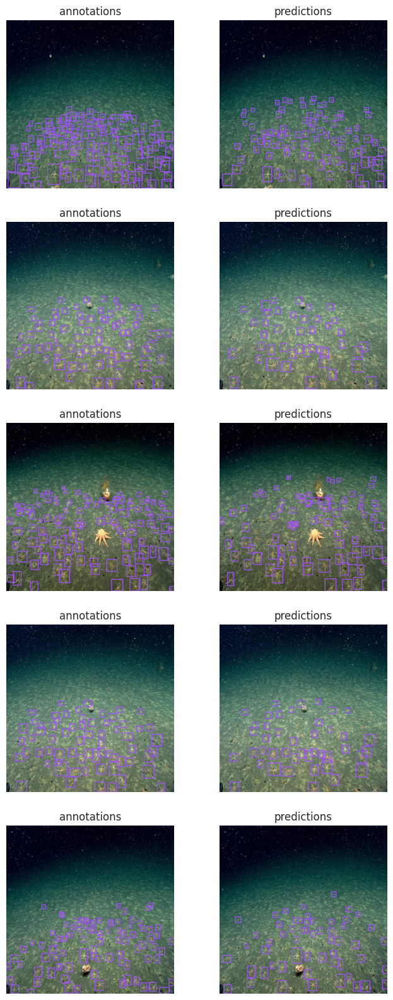

In [71]:
import supervision as sv

MAX_IMAGE_COUNT = 5

n = min(MAX_IMAGE_COUNT, len(ds.images))

keys = list(ds.images.keys())
keys = random.sample(keys, n)

box_annotator = sv.BoxAnnotator()

images = []
titles = []

for key in keys:
    frame_with_annotations = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=ds.annotations[key],
        #skip_label=True
    )
    images.append(frame_with_annotations)
    titles.append('annotations')
    frame_with_predictions = box_annotator.annotate(
        scene=ds.images[key].copy(),
        detections=predictions[key],
        #skip_label=True
    )
    images.append(frame_with_predictions)
    titles.append('predictions')

%matplotlib inline
sv.plot_images_grid(images=images, titles=titles, grid_size=(n, 2), size=(2 * 4, n * 4))

### Calculate confusion matrix

In [54]:
!pip install onemetric

images is deprecated: `DetectionDataset.images` property is deprecated and will be removed in `supervision-0.26.0`. Iterate with `for path, image, annotation in dataset:` instead.


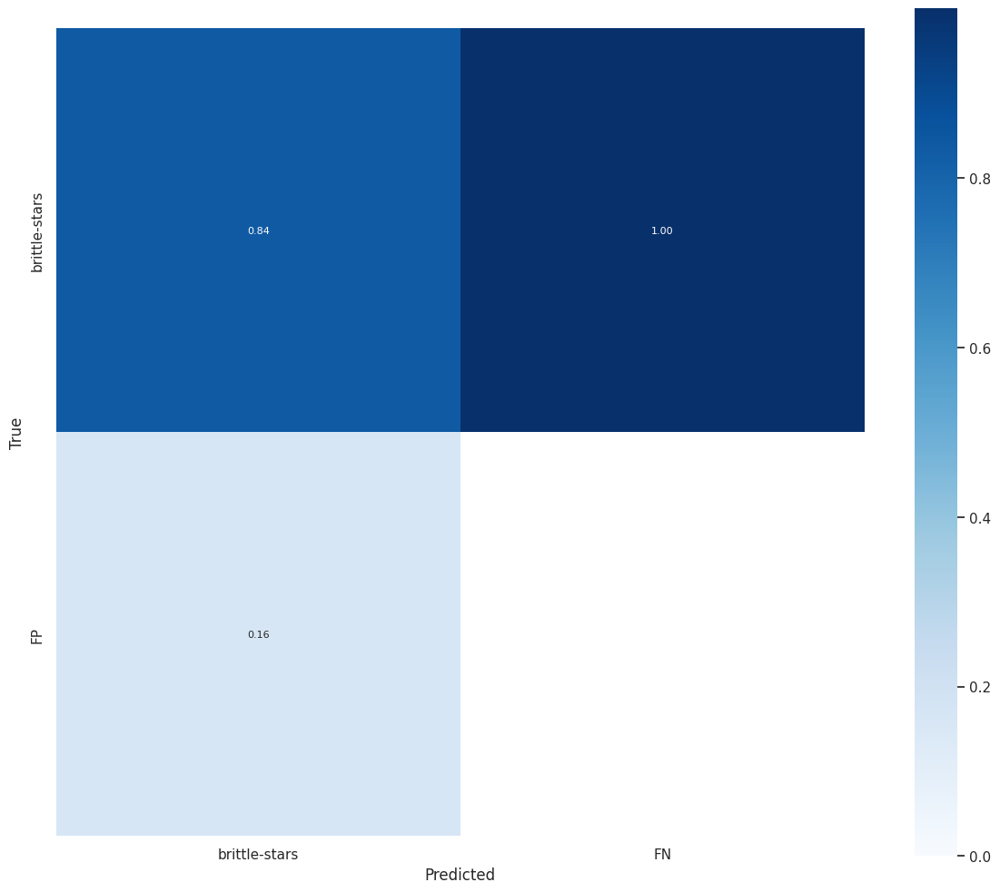

In [72]:
import os

import numpy as np

from onemetric.cv.object_detection import ConfusionMatrix

keys = list(ds.images.keys())

annotation_batches, prediction_batches = [], []

for key in keys:
    annotation=ds.annotations[key]
    annotation_batch = np.column_stack((
        annotation.xyxy,
        annotation.class_id
    ))
    annotation_batches.append(annotation_batch)

    prediction=predictions[key]
    prediction_batch = np.column_stack((
        prediction.xyxy,
        prediction.class_id,
        prediction.confidence
    ))
    prediction_batches.append(prediction_batch)

confusion_matrix = ConfusionMatrix.from_detections(
    true_batches=annotation_batches,
    detection_batches=prediction_batches,
    num_classes=len(ds.classes),
    conf_threshold=CONFIDENCE_TRESHOLD
)

confusion_matrix.plot(os.path.join(HOME, "confusion_matrix.png"), class_names=ds.classes)

  # 🏆 Congratulations

### Learning Resources

Roboflow has produced many resources that you may find interesting as you advance your knowledge of computer vision:

- [Roboflow Notebooks](https://github.com/roboflow/notebooks): A repository of over 20 notebooks that walk through how to train custom models with a range of model types, from YOLOv7 to SegFormer.
- [Roboflow YouTube](https://www.youtube.com/c/Roboflow): Our library of videos featuring deep dives into the latest in computer vision, detailed tutorials that accompany our notebooks, and more.
- [Roboflow Discuss](https://discuss.roboflow.com/): Have a question about how to do something on Roboflow? Ask your question on our discussion forum.
- [Roboflow Models](https://roboflow.com): Learn about state-of-the-art models and their performance. Find links and tutorials to guide your learning.

### Convert data formats

Roboflow provides free utilities to convert data between dozens of popular computer vision formats. Check out [Roboflow Formats](https://roboflow.com/formats) to find tutorials on how to convert data between formats in a few clicks.

### Connect computer vision to your project logic

[Roboflow Templates](https://roboflow.com/templates) is a public gallery of code snippets that you can use to connect computer vision to your project logic. Code snippets range from sending emails after inference to measuring object distance between detections.